<a href="https://colab.research.google.com/github/amyy2/thesis/blob/main/MoCo_BraTS_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [67]:
import numpy as np
import torch
import torchvision
import torchvision.models as models
from torchvision import transforms
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, Subset
import os
import matplotlib.pyplot as plt
import nibabel as nib
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns

In [68]:
from google.colab import drive
drive.mount('/content/drive')
dataset_path = '/content/drive/MyDrive/archive'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [69]:
!git clone https://github.com/facebookresearch/moco.git
%cd moco

Cloning into 'moco'...
remote: Enumerating objects: 112, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 112 (delta 41), reused 64 (delta 34), pack-reused 38
Receiving objects: 100% (112/112), 65.84 KiB | 1.65 MiB/s, done.
Resolving deltas: 100% (51/51), done.
/content/moco/moco/moco/moco/moco


# Data preprocessing

In [70]:
class BraTSDataset(Dataset):
    def __init__(self, path, transform=None):
        self.path = path
        self.transform = transform

    def __len__(self):
        return len(os.listdir(self.path))

    def __getitem__(self, index):
        folder = os.listdir(self.path)[index]
        folder_path = self.path + '/' + folder + '/' + folder
        image = nib.load(folder_path + '_flair.nii').get_fdata()[56:184, 70:198, 77]
        mask = nib.load(folder_path + '_seg.nii').get_fdata()[56:184, 70:198, 77]

        image = (image - np.min(image)) / (np.max(image) - np.min(image))
        image = image.astype(np.float32)
        image = Image.fromarray((image * 255).astype(np.uint8))
        image = image.convert('RGB')

        if self.transform:
            transform_1 = self.transform(image)
            transform_2 = self.transform(image)

            return (transform_1, transform_2), mask

        else:
            return transforms.Compose([transforms.ToTensor()])(image), transforms.Compose([transforms.ToTensor()])(mask)

In [71]:
def calculate_mean_std(dataset):
    means = []
    stds = []

    for i in tqdm(range(len(dataset))):
        image, _ = dataset[i]
        image = image.astype(np.float32)
        means.append(np.mean(image))
        stds.append(np.std(image))

    mean = np.mean(means)
    std = np.mean(stds)
    return mean, std

mean = 0.1276496946811676
std = 0.21015071868896484

In [72]:
transform = transforms.Compose([
    #transforms.Grayscale(num_output_channels=3),
    #transforms.ToPILImage(),
    transforms.RandomApply([transforms.RandomResizedCrop(size=(128, 128), scale=(0.8, 1.0))], p=0.3),
    transforms.RandomApply([transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))], p=0.5),
    transforms.RandomApply([transforms.RandomHorizontalFlip()], p=0.3),
    transforms.RandomApply([transforms.RandomVerticalFlip()], p=0.3),
    transforms.RandomApply([transforms.RandomRotation(degrees=(0, 360))], p=0.3),
    transforms.RandomApply([transforms.RandomAffine(degrees=0, translate=(0.2, 0.2), scale=(0.8, 1.2), shear=10)], p=0.3),
    #transforms.RandomPerspective(distortion_scale=0.5, p=0.5, interpolation=3, fill=0),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

# Pretrained MoCo

In [73]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# This source code is licensed under the MIT license found in the
# LICENSE file in the root directory of this source tree.

import torch
import torch.nn as nn


class MoCo(nn.Module):
    """
    Build a MoCo model with: a query encoder, a key encoder, and a queue
    https://arxiv.org/abs/1911.05722
    """

    def __init__(self, base_encoder, dim=128, K=65536, m=0.999, T=0.07, mlp=False):
        """
        dim: feature dimension (default: 128)
        K: queue size; number of negative keys (default: 65536)
        m: moco momentum of updating key encoder (default: 0.999)
        T: softmax temperature (default: 0.07)
        """
        super(MoCo, self).__init__()

        self.K = K
        self.m = m
        self.T = T

        # create the encoders
        # num_classes is the output fc dimension
        self.encoder_q = base_encoder(num_classes=dim)
        self.encoder_k = base_encoder(num_classes=dim)

        if mlp:  # hack: brute-force replacement
            dim_mlp = self.encoder_q.fc.weight.shape[1]
            self.encoder_q.fc = nn.Sequential(
                nn.Linear(dim_mlp, dim_mlp), nn.ReLU(), self.encoder_q.fc
            )
            self.encoder_k.fc = nn.Sequential(
                nn.Linear(dim_mlp, dim_mlp), nn.ReLU(), self.encoder_k.fc
            )

        for param_q, param_k in zip(
            self.encoder_q.parameters(), self.encoder_k.parameters()
        ):
            param_k.data.copy_(param_q.data)  # initialize
            param_k.requires_grad = False  # not update by gradient

        # create the queue
        self.register_buffer("queue", torch.randn(dim, K))
        self.queue = nn.functional.normalize(self.queue, dim=0)

        self.register_buffer("queue_ptr", torch.zeros(1, dtype=torch.long))

    @torch.no_grad()
    def _momentum_update_key_encoder(self):
        """
        Momentum update of the key encoder
        """
        for param_q, param_k in zip(
            self.encoder_q.parameters(), self.encoder_k.parameters()
        ):
            param_k.data = param_k.data * self.m + param_q.data * (1.0 - self.m)

    @torch.no_grad()
    def _dequeue_and_enqueue(self, keys):
        # gather keys before updating queue
        keys = concat_all_gather(keys)

        batch_size = keys.shape[0]

        ptr = int(self.queue_ptr)
        assert self.K % batch_size == 0  # for simplicity

        # replace the keys at ptr (dequeue and enqueue)
        self.queue[:, ptr : ptr + batch_size] = keys.T
        ptr = (ptr + batch_size) % self.K  # move pointer

        self.queue_ptr[0] = ptr

    @torch.no_grad()
    def _batch_shuffle_ddp(self, x):
        """
        Batch shuffle, for making use of BatchNorm.
        *** Only support DistributedDataParallel (DDP) model. ***
        """
        # gather from all gpus
        batch_size_this = x.shape[0]
        x_gather = concat_all_gather(x)
        batch_size_all = x_gather.shape[0]

        num_gpus = batch_size_all // batch_size_this

        # random shuffle index
        idx_shuffle = torch.randperm(batch_size_all).cuda()

        # broadcast to all gpus
        #torch.distributed.broadcast(idx_shuffle, src=0)

        # index for restoring
        idx_unshuffle = torch.argsort(idx_shuffle)

        # shuffled index for this gpu
        #gpu_idx = torch.distributed.get_rank()
        gpu_idx = torch.cuda.current_device()
        idx_this = idx_shuffle.view(num_gpus, -1)[gpu_idx]

        return x_gather[idx_this], idx_unshuffle

    @torch.no_grad()
    def _batch_unshuffle_ddp(self, x, idx_unshuffle):
        """
        Undo batch shuffle.
        *** Only support DistributedDataParallel (DDP) model. ***
        """
        # gather from all gpus
        batch_size_this = x.shape[0]
        x_gather = concat_all_gather(x)
        batch_size_all = x_gather.shape[0]

        num_gpus = batch_size_all // batch_size_this

        # restored index for this gpu
        #gpu_idx = torch.distributed.get_rank()
        gpu_idx = torch.cuda.current_device()
        idx_this = idx_unshuffle.view(num_gpus, -1)[gpu_idx]

        return x_gather[idx_this]

    def forward(self, im_q, im_k):
        """
        Input:
            im_q: a batch of query images
            im_k: a batch of key images
        Output:
            logits, targets
        """

        # compute query features
        q = self.encoder_q(im_q)  # queries: NxC
        q = nn.functional.normalize(q, dim=1)

        # compute key features
        with torch.no_grad():  # no gradient to keys
            self._momentum_update_key_encoder()  # update the key encoder
            """
            # shuffle for making use of BN
            im_k, idx_unshuffle = self._batch_shuffle_ddp(im_k)

            k = self.encoder_k(im_k)  # keys: NxC
            k = nn.functional.normalize(k, dim=1)

            # undo shuffle
            k = self._batch_unshuffle_ddp(k, idx_unshuffle)
            """
            k = self.encoder_k(im_k)
            k = nn.functional.normalize(k, dim=1)

        # compute logits
        # Einstein sum is more intuitive
        # positive logits: Nx1
        l_pos = torch.einsum("nc,nc->n", [q, k]).unsqueeze(-1)
        # negative logits: NxK
        l_neg = torch.einsum("nc,ck->nk", [q, self.queue.clone().detach()])

        # logits: Nx(1+K)
        logits = torch.cat([l_pos, l_neg], dim=1)

        # apply temperature
        logits /= self.T

        # labels: positive key indicators
        labels = torch.zeros(logits.shape[0], dtype=torch.long).cuda()

        # dequeue and enqueue
        #self._dequeue_and_enqueue(k)

        return logits, labels


# utils
@torch.no_grad()
def concat_all_gather(tensor):
    """
    Performs all_gather operation on the provided tensors.
    *** Warning ***: torch.distributed.all_gather has no gradient.
    """
    tensors_gather = [
        torch.ones_like(tensor) for _ in range(torch.distributed.get_world_size())
    ]
    torch.distributed.all_gather(tensors_gather, tensor, async_op=False)

    output = torch.cat(tensors_gather, dim=0)
    return output

In [74]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# This source code is licensed under the MIT license found in the
# LICENSE file in the root directory of this source tree.

import random

from PIL import ImageFilter


class TwoCropsTransform:
    """Take two random crops of one image as the query and key."""

    def __init__(self, base_transform):
        self.base_transform = base_transform

    def __call__(self, x):
        q = self.base_transform(x)
        k = self.base_transform(x)
        return [q, k]


class GaussianBlur:
    """Gaussian blur augmentation in SimCLR https://arxiv.org/abs/2002.05709"""

    def __init__(self, sigma=[0.1, 2.0]):
        self.sigma = sigma

    def __call__(self, x):
        sigma = random.uniform(self.sigma[0], self.sigma[1])
        x = x.filter(ImageFilter.GaussianBlur(radius=sigma))
        return x

In [75]:
model_names = sorted(
    name
    for name in models.__dict__
    if name.islower() and not name.startswith("__") and callable(models.__dict__[name])
)

arch = "resnet50"
workers = 2
epochs = 100
batch_size = 64
learning_rate = 0.01
momentum = 0.9
weight_decay = 1e-4
print_freq = 10
resume = ""  # path to the latest checkpoint (default: none)
world_size = 1
rank = 1
dist_url = "tcp://224.66.41.62:23456"
dist_backend = "nccl"
seed = None  # seed for initializing training
if torch.cuda.is_available():
    gpu = 0
    print("CUDA is available. Using GPU.")
else:
    gpu = None
    print("CUDA is not available. Using CPU.")
moco_dim = 128
moco_k = 65536
moco_m = 0.999
moco_t = 0.07
mlp = False  # use mlp head
aug_plus = False  # use moco v2 data augmentation
cos = False  # use cosine lr schedule
multiprocessing_distributed = False
pretrained = True
distributed = False

CUDA is available. Using GPU.


In [76]:
#!/usr/bin/env python

# Copyright (c) Meta Platforms, Inc. and affiliates.

# This source code is licensed under the MIT license found in the
# LICENSE file in the root directory of this source tree.

"""
import argparse
import builtins
import math
import os
import random
import shutil
import time
import warnings

import torch
import torch.backends.cudnn as cudnn
import torch.distributed as dist
import torch.multiprocessing as mp
import torch.nn as nn
import torch.nn.parallel
import torch.optim
import torch.utils.data
import torch.utils.data.distributed
import torchvision.datasets as datasets
import torchvision.models as models
import torchvision.transforms as transforms

loss_values = []

def main():
    global arch, workers, epochs, batch_size, learning_rate, momentum, weight_decay, print_freq, resume, world_size, rank, dist_url, dist_backend, seed, gpu, moco_dim, moco_k, moco_m, moco_t, mlp, aug_plus, cos

    mp.spawn(main_worker, args=(0), nprocs=world_size, join=False)

    if seed is not None:
        random.seed(seed)
        torch.manual_seed(seed)
        cudnn.deterministic = True
        warnings.warn(
            "You have chosen to seed training. "
            "This will turn on the CUDNN deterministic setting, "
            "which can slow down your training considerably! "
            "You may see unexpected behavior when restarting "
            "from checkpoints."
        )

    if gpu is not None:
        warnings.warn(
            "You have chosen a specific GPU. This will completely "
            "disable data parallelism."
        )

    if dist_url == "env://" and world_size == -1:
        world_size = int(os.environ["WORLD_SIZE"])

    distributed = world_size > 1 or multiprocessing_distributed

    ngpus_per_node = torch.cuda.device_count()
    if multiprocessing_distributed:
        # Since we have ngpus_per_node processes per node, the total world_size
        # needs to be adjusted accordingly
        world_size = ngpus_per_node * world_size
        # Use torch.multiprocessing.spawn to launch distributed processes: the
        # main_worker process function
        mp.spawn(main_worker, nprocs=ngpus_per_node, args=(ngpus_per_node))
    else:
        # Simply call main_worker function
        main_worker(gpu, ngpus_per_node)


def main_worker(gpu, ngpus_per_node):
    global arch, workers, epochs, batch_size, learning_rate, momentum, weight_decay, print_freq, resume, world_size, rank, dist_url, dist_backend, seed, moco_dim, moco_k, moco_m, moco_t, mlp, aug_plus, cos

    # suppress printing if not master
    if multiprocessing_distributed and gpu != 0:

        def print_pass(*args):
            pass

        builtins.print = print_pass

    if gpu is not None:
        print("Use GPU: {} for training".format(gpu))

    if distributed:
        if dist_url == "env://" and rank == -1:
            rank = int(os.environ["RANK"])
        if multiprocessing_distributed:
            # For multiprocessing distributed training, rank needs to be the
            # global rank among all the processes
            rank = rank * ngpus_per_node + gpu
        dist.init_process_group(
            backend=dist_backend,
            init_method=dist_url,
            world_size=world_size,
            rank=rank,
        )
    # create model
    print("=> creating model '{}'".format(arch))
    model = MoCo(
        models.__dict__[arch],
        moco_dim,
        moco_k,
        moco_m,
        moco_t,
        mlp,
    )

    if distributed:
        # For multiprocessing distributed, DistributedDataParallel constructor
        # should always set the single device scope, otherwise,
        # DistributedDataParallel will use all available devices.
        if gpu is not None:
            torch.cuda.set_device(gpu)
            model.cuda(gpu)
            # When using a single GPU per process and per
            # DistributedDataParallel, we need to divide the batch size
            # ourselves based on the total number of GPUs we have
            batch_size = int(batch_size / ngpus_per_node)
            workers = int((workers + ngpus_per_node - 1) / ngpus_per_node)
            model = torch.nn.parallel.DistributedDataParallel(
                model, device_ids=[gpu]
            )
        else:
            model.cuda()
            # DistributedDataParallel will divide and allocate batch_size to all
            # available GPUs if device_ids are not set
            model = torch.nn.parallel.DistributedDataParallel(model)
    elif gpu is not None:
        torch.cuda.set_device(gpu)
        model = model.cuda(gpu)
        # comment out the following line for debugging
        #raise NotImplementedError("Only DistributedDataParallel is supported.")
    else:
        # AllGather implementation (batch shuffle, queue update, etc.) in
        # this code only supports DistributedDataParallel.
        raise NotImplementedError("Only DistributedDataParallel is supported.")

    # define loss function (criterion) and optimizer
    criterion = nn.CrossEntropyLoss().cuda(gpu)

    optimizer = torch.optim.SGD(
        model.parameters(),
        lr=learning_rate,
        momentum=momentum,
        weight_decay=weight_decay,
    )

    # optionally resume from a checkpoint
    if resume:
        if os.path.isfile(resume):
            print("=> loading checkpoint '{}'".format(resume))
            if gpu is None:
                checkpoint = torch.load(resume)
            else:
                # Map model to be loaded to specified single gpu.
                loc = "cuda:{}".format(gpu)
                checkpoint = torch.load(resume, map_location=loc)
            start_epoch = checkpoint["epoch"]
            model.load_state_dict(checkpoint["state_dict"])
            optimizer.load_state_dict(checkpoint["optimizer"])
            print(
                "=> loaded checkpoint '{}' (epoch {})".format(
                    resume, checkpoint["epoch"]
                )
            )
        else:
            print("=> no checkpoint found at '{}'".format(resume))

    cudnn.benchmark = True

    # Data loading code
    normalize = transforms.Normalize(
        mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
    )
    if aug_plus:
        # MoCo v2's aug: similar to SimCLR https://arxiv.org/abs/2002.05709
        augmentation = [
            transforms.RandomResizedCrop(224, scale=(0.2, 1.0)),
            transforms.RandomApply(
                [transforms.ColorJitter(0.4, 0.4, 0.4, 0.1)], p=0.8  # not strengthened
            ),
            transforms.RandomGrayscale(p=0.2),
            transforms.RandomApply([GaussianBlur([0.1, 2.0])], p=0.5),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            normalize,
        ]
    else:
        # MoCo v1's aug: the same as InstDisc https://arxiv.org/abs/1805.01978
        augmentation = [
            transforms.RandomResizedCrop(224, scale=(0.2, 1.0)),
            transforms.RandomGrayscale(p=0.2),
            transforms.ColorJitter(0.4, 0.4, 0.4, 0.4),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            normalize,
        ]

    train_dataset = BraTSDataset('/content/drive/MyDrive/archive/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData', transform)

    if distributed:
        train_sampler = torch.utils.data.distributed.DistributedSampler(train_dataset)
    else:
        train_sampler = None

    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,  # Shuffle the dataset
        num_workers=workers,
        pin_memory=True,
        drop_last=True,
    )

    for epoch in range(0, epochs):
        if distributed:
            train_sampler.set_epoch(epoch)
        adjust_learning_rate(optimizer, epoch)

        # train for one epoch
        train(train_loader, model, criterion, optimizer, epoch)

        if not multiprocessing_distributed or (
            multiprocessing_distributed and rank % ngpus_per_node == 0
        ):
            save_checkpoint(
                {
                    "epoch": epoch + 1,
                    "arch": arch,
                    "state_dict": model.state_dict(),
                    "optimizer": optimizer.state_dict(),
                },
                is_best=False,
                filename="checkpoint_{:04d}.pth.tar".format(epoch),
            )

def train(train_loader, model, criterion, optimizer, epoch):
    batch_time = AverageMeter("Time", ":6.3f")
    data_time = AverageMeter("Data", ":6.3f")
    losses = AverageMeter("Loss", ":.4e")
    top1 = AverageMeter("Acc@1", ":6.2f")
    top5 = AverageMeter("Acc@5", ":6.2f")
    progress = ProgressMeter(
        len(train_loader),
        [batch_time, data_time, losses, top1, top5],
        prefix="Epoch: [{}]".format(epoch),
    )

    # switch to train mode
    model.train()

    end = time.time()
    for i, (images, _) in enumerate(train_loader):
        # measure data loading time
        data_time.update(time.time() - end)

        if gpu is not None:
            images[0] = images[0].cuda(gpu, non_blocking=True)
            images[1] = images[1].cuda(gpu, non_blocking=True)

        # compute output
        output, target = model(im_q=images[0], im_k=images[1])
        loss = criterion(output, target)
        loss_values.append(loss)

        # acc1/acc5 are (K+1)-way contrast classifier accuracy
        # measure accuracy and record loss
        acc1, acc5 = accuracy(output, target, topk=(1, 5))
        losses.update(loss.item(), images[0].size(0))
        top1.update(acc1[0], images[0].size(0))
        top5.update(acc5[0], images[0].size(0))

        # compute gradient and do SGD step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # measure elapsed time
        batch_time.update(time.time() - end)
        end = time.time()

        if i % print_freq == 0:
            progress.display(i)


def save_checkpoint(state, is_best, filename="checkpoint.pth.tar"):
    torch.save(state, filename)
    if is_best:
        shutil.copyfile(filename, "model_best.pth.tar")


class AverageMeter:

    def __init__(self, name, fmt=":f"):
        self.name = name
        self.fmt = fmt
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

    def __str__(self):
        fmtstr = "{name} {val" + self.fmt + "} ({avg" + self.fmt + "})"
        return fmtstr.format(**self.__dict__)


class ProgressMeter:
    def __init__(self, num_batches, meters, prefix=""):
        self.batch_fmtstr = self._get_batch_fmtstr(num_batches)
        self.meters = meters
        self.prefix = prefix

    def display(self, batch):
        entries = [self.prefix + self.batch_fmtstr.format(batch)]
        entries += [str(meter) for meter in self.meters]
        print("\t".join(entries))

    def _get_batch_fmtstr(self, num_batches):
        num_digits = len(str(num_batches // 1))
        fmt = "{:" + str(num_digits) + "d}"
        return "[" + fmt + "/" + fmt.format(num_batches) + "]"


def adjust_learning_rate(optimizer, epoch):
    global learning_rate
    lr = learning_rate
    schedule = [50, 100, 150]
    if cos:  # cosine lr schedule
        lr *= 0.5 * (1.0 + math.cos(math.pi * epoch / epochs))
    else:  # stepwise lr schedule
        for milestone in schedule:
            lr *= 0.1 if epoch >= milestone else 1.0
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr


def accuracy(output, target, topk=(1,)):
    with torch.no_grad():
        maxk = max(topk)
        batch_size = target.size(0)

        _, pred = output.topk(maxk, 1, True, True)
        pred = pred.t()
        correct = pred.eq(target.view(1, -1).expand_as(pred))

        res = []
        for k in topk:
            correct_k = correct[:k].reshape(-1).float().sum(0, keepdim=True)
            res.append(correct_k.mul_(100.0 / batch_size))
        return res


if __name__ == "__main__":
    main()
    """

'\nimport argparse\nimport builtins\nimport math\nimport os\nimport random\nimport shutil\nimport time\nimport warnings\n\nimport torch\nimport torch.backends.cudnn as cudnn\nimport torch.distributed as dist\nimport torch.multiprocessing as mp\nimport torch.nn as nn\nimport torch.nn.parallel\nimport torch.optim\nimport torch.utils.data\nimport torch.utils.data.distributed\nimport torchvision.datasets as datasets\nimport torchvision.models as models\nimport torchvision.transforms as transforms\n\nloss_values = []\n\ndef main():\n    global arch, workers, epochs, batch_size, learning_rate, momentum, weight_decay, print_freq, resume, world_size, rank, dist_url, dist_backend, seed, gpu, moco_dim, moco_k, moco_m, moco_t, mlp, aug_plus, cos\n\n    mp.spawn(main_worker, args=(0), nprocs=world_size, join=False)\n\n    if seed is not None:\n        random.seed(seed)\n        torch.manual_seed(seed)\n        cudnn.deterministic = True\n        warnings.warn(\n            "You have chosen to seed

In [77]:
"""
plt.title("Loss values")
plt.plot(range(len(loss_values)), [l.cpu().detach().numpy() for l in loss_values])
plt.show()
"""

'\nplt.title("Loss values")\nplt.plot(range(len(loss_values)), [l.cpu().detach().numpy() for l in loss_values])\nplt.show()\n'

# Downstream task

In [78]:
class ModifiedEncoder(nn.Module):
    def __init__(self, encoder_q):
        super(ModifiedEncoder, self).__init__()
        self.initial_layers = nn.Sequential(
            encoder_q.conv1,
            encoder_q.bn1,
            encoder_q.relu,
            encoder_q.maxpool
        )
        self.layer1 = encoder_q.layer1
        self.layer2 = encoder_q.layer2
        self.layer3 = encoder_q.layer3
        self.layer4 = encoder_q.layer4

    def forward(self, x):
        x0 = self.initial_layers(x)
        x1 = self.layer1(x0)
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)
        return x0, x1, x2, x3, x4

def double_conv_2d(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True)
    )

class UNet2D(nn.Module):
    def __init__(self, modified_encoder, num_classes):
        super(UNet2D, self).__init__()

        self.encoder = modified_encoder

        self.pool = nn.MaxPool2d(2)
        self.upconv3 = nn.ConvTranspose2d(2048, 1024, kernel_size=2, stride=2)
        self.upconv2 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.upconv1 = nn.ConvTranspose2d(512, 128, kernel_size=2, stride=2)

        self.dec3 = double_conv_2d(2048, 1024)
        self.dec2 = double_conv_2d(1024, 512)
        self.dec1 = double_conv_2d(128 + 256, 128)

        self.out_conv = nn.Conv2d(128, num_classes, kernel_size=1)

    def forward(self, x):

        x0, x1, x2, x3, x4 = self.encoder(x)

        dec3 = self.dec3(torch.cat([F.interpolate(self.upconv3(x4), size=
         (x3.size(2), x3.size(3)), mode='bilinear', align_corners=True), x3],
                                   dim=1))
        dec2 = self.dec2(torch.cat([self.upconv2(dec3), x2], dim=1))
        dec1 = self.dec1(torch.cat([self.upconv1(dec2), x1], dim=1))

        output = F.interpolate(dec1, size=(128, 128), mode='bilinear',
                               align_corners=True)

        return self.out_conv(output)

In [79]:
train_dataset = BraTSDataset('/content/drive/MyDrive/archive/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData')
train_subset = Subset(train_dataset, range(10))
validation_dataset = BraTSDataset('/content/drive/MyDrive/archive/BraTS2020_ValidationData/MICCAI_BraTS2020_ValidationData')

train_loader = DataLoader(
    train_dataset,
    batch_size=64,
    num_workers=0,
    shuffle=True
)

validation_loader = DataLoader(
    validation_dataset,
    batch_size=64,
    num_workers=0,
    shuffle=True
)

In [80]:
num_epochs = 200
num_classes = 4

def dice_loss(pred, target, batch, epsilon=1e-6):

    probability1 = pred.squeeze().cpu().detach().numpy()
    targets1 = target.squeeze().cpu().detach().numpy()

    if batch % 5 == 0:
        fig, axs = plt.subplots(2, 4, figsize=(15, 8))

        axs[0][0].set_title('Class 1 (Predicted)')
        axs[0][0].imshow(probability1[0][0])
        axs[1][0].set_title('Class 1 (True)')
        axs[1][0].imshow(targets1[0][0])

        axs[0][1].set_title('Class 2 (Predicted)')
        axs[0][1].imshow(probability1[0][1])
        axs[1][1].set_title('Class 2 (True)')
        axs[1][1].imshow(targets1[0][1])

        axs[0][2].set_title('Class 3 (Predicted)')
        axs[0][2].imshow(probability1[0][2])
        axs[1][2].set_title('Class 3 (True)')
        axs[1][2].imshow(targets1[0][2])

        axs[0][3].set_title('Class 4 (Predicted)')
        axs[0][3].imshow(probability1[0][3])
        axs[1][3].set_title('Class 4 (True)')
        axs[1][3].imshow(targets1[0][3])

        plt.show()

    pred = F.softmax(pred, dim=0)

    total_loss = 0.0
    weights = [1, 1, 1, 1]

    for class_id in range(pred.size(1)):
        pred_flat = pred[:, class_id, ...].contiguous().view(-1)
        target_flat = target[:, class_id, ...].contiguous().view(-1)

        TP = (pred_flat * target_flat).sum()
        FP = (pred_flat * (1 - target_flat)).sum()
        FN = ((1 - pred_flat) * target_flat).sum()

        dice_score = (2 * TP + epsilon) / (2 * TP + FP + FN + epsilon)

        dice_loss_class = 1 - dice_score
        total_loss += dice_loss_class * weights[class_id]

    return total_loss / sum(weights)

def focal_loss(pred, target):

      alpha=0.25
      gamma=2.0

      ce_loss = torch.nn.functional.cross_entropy(pred, target, reduction='none')
      pt = torch.exp(-ce_loss)
      focal_loss = (alpha * (1-pt)**gamma * ce_loss).mean()

      return focal_loss

def metrics_per_classes(probabilities: np.ndarray, truth: np.ndarray, threshold: float = 0.5,
                        eps: float = 1e-9, classes: list = ['WT', 'TC', 'ET', 'BG']) -> np.ndarray:

    metrics_sum = {'Dice': 0, 'IoU': 0, 'Specificity': 0, 'Sensitivity': 0}
    num_classes = len(classes)
    total_samples = 0

    predictions = (probabilities >= threshold).float()
    truth = truth.float()

    for i in range(probabilities.shape[0]):
        for class_ in range(num_classes):
            prediction = predictions[i][class_]
            truth_ = truth[i][class_]
            intersection = (truth_ * prediction).sum()
            union = truth_.sum() + prediction.sum() - intersection
            true_negative = ((~truth_.bool()) & (~prediction.bool())).sum()
            false_positive = ((~truth_.bool()) & prediction.bool()).sum()
            false_negative = (truth_.bool() & (~prediction.bool())).sum()

            dice = (2.0 * intersection + eps) / (union + intersection + eps)
            iou = (intersection + eps) / (union + eps)
            specificity = (true_negative + eps) / (true_negative + false_positive + eps)
            sensitivity = (intersection + eps) / (intersection + false_negative + eps)

            metrics_sum['Dice'] += dice.item()
            metrics_sum['IoU'] += iou.item()
            metrics_sum['Specificity'] += specificity.item()
            metrics_sum['Sensitivity'] += sensitivity.item()
            total_samples += 1

    global_metrics = {metric: total / total_samples for metric, total in metrics_sum.items()}

    return global_metrics

def evaluation_metrics(pred, target, epsilon=1e-6):
    dice_list = []
    iou_list = []
    sensitivity_list = []
    specificity_list = []

    pred_softmax = F.softmax(pred, dim=0)
    pred_argmax = torch.argmax(pred_softmax, dim=0)

    for class_id in range(num_classes):
        pred_class = (pred_argmax == class_id).float()
        target_class = (target == class_id).float()

        TP = (pred_class * target_class).sum().item()
        TN = ((1 - pred_class) * (1 - target_class)).sum().item()
        FP = (pred_class * (1 - target_class)).sum().item()
        FN = ((1 - pred_class) * target_class).sum().item()

        dice_score = (2 * TP) / (2 * TP + FP + FN + epsilon)
        iou_score = (TP) / (TP + FP + FN + epsilon)
        sensitivity_score = (TP) / (TP + FN + epsilon)
        specificity_score = (TN) / (TN + FP + epsilon)

        dice_list.append(dice_score)
        iou_list.append(iou_score)
        sensitivity_list.append(sensitivity_score)
        specificity_list.append(specificity_score)

    dice = sum(dice_list) / len(dice_list)
    iou = sum(iou_list) / len(iou_list)
    sensitivity = sum(sensitivity_list) / len(sensitivity_list)
    specificity = sum(specificity_list) / len(specificity_list)

    return dice, iou, sensitivity, specificity

class PolyLR(torch.optim.lr_scheduler._LRScheduler):
    def __init__(self, optimizer, num_epochs, power=0.9, last_epoch=-1):
        self.num_epochs = num_epochs
        self.power = power
        super(PolyLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        factor = (1 - self.last_epoch / self.num_epochs) ** self.power
        return [base_lr * factor for base_lr in self.base_lrs]

moco_model = MoCo(models.__dict__[arch], dim=128, K=65536, m=0.999, T=0.07, mlp=False)
checkpoint = torch.load('/content/drive/MyDrive/checkpoint_0099.pth.tar')
moco_model.load_state_dict(checkpoint['state_dict'])

modified_encoder = ModifiedEncoder(moco_model.encoder_q)

unet_model = UNet2D(modified_encoder, 4)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
moco_model = moco_model.to(device)
unet_model = unet_model.to(device)

optimizer = torch.optim.Adam(unet_model.parameters(), lr=0.001)
scheduler = PolyLR(optimizer, num_epochs, power=0.9)
#scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.1)

loss_function = dice_loss

scores = {'loss': [], 'dice': [], 'iou': [], 'sensitivity': [], 'specificity': []}
val_scores = {'loss': [], 'dice': [], 'iou': [], 'sensitivity': [], 'specificity': []}

def train():

    for epoch in range(num_epochs):

        progress = tqdm(train_loader)
        progress.set_description(f"Epoch {epoch+1}/{num_epochs}")

        loss_values = []
        dice_scores = []
        iou_scores = []
        sensitivity_scores = []
        specificity_scores = []

        val_loss_values = []
        val_dice_scores = []
        val_iou_scores = []
        val_sensitivity_scores = []
        val_specificity_scores = []

        for batch, (image, mask) in enumerate(progress):

            unet_model.train()

            image = image.cuda()
            mask = mask.cuda()

            output = unet_model(image.float())

            output = unet_model(image)
            output = F.softmax(output, dim=1)

            mapping = {0: 0, 1: 1, 2: 2, 4: 3}
            for old_label, new_label in mapping.items():
                mask[mask == old_label] = new_label

            mask = mask.long()
            one_hot = torch.zeros(mask.size(0), 4, mask.size(2), mask.size(2), device=mask.device)
            mask_unsqueezed = mask.unsqueeze(1)
            one_hot = one_hot.scatter_(1, mask, 1)
            loss = dice_loss(output, one_hot, batch)
            loss_values.append(loss)

            with torch.no_grad():
                for i in range(output.size(0)):
                    #iou, sensitivity, specificity, accuracy = evaluation_metrics(output[i], mask[i])
                    metrics = metrics_per_classes(output[i], one_hot[i])
                    dice = metrics['Dice']
                    iou = metrics['IoU']
                    sensitivity = metrics['Sensitivity']
                    specificity = metrics['Specificity']
                    dice_scores.append(dice)
                    iou_scores.append(iou)
                    sensitivity_scores.append(sensitivity)
                    specificity_scores.append(specificity)

            progress.set_postfix(loss=loss.item())

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            if batch == 0:
                with torch.no_grad():
                    image_cpu = image[0].squeeze(0).cpu().numpy()
                    mask_cpu = mask[0].cpu().numpy()
                    output_cpu = output[0].argmax(dim=0).cpu().numpy()

                    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
                    axs[0].imshow(image_cpu[0])
                    axs[0].set_title('Input')
                    axs[1].imshow(output_cpu)
                    axs[1].set_title('Output')
                    axs[2].imshow(mask_cpu[0])
                    axs[2].set_title('Target')
                    plt.show()

                    print('Loss: ', loss.item())
                    #print('Learning rate: ', scheduler.get_last_lr()[0])

        unet_model.eval()

        with torch.no_grad():
            for batch, (image, mask) in enumerate(validation_loader):

                image = image.to(device)
                mask = mask.to(device)

                unet_model.train()

                output = unet_model(image)

                mapping = {0: 0, 1: 1, 2: 2, 4: 3}
                for old_label, new_label in mapping.items():
                    mask[mask == old_label] = new_label

                mask = mask.long()
                one_hot = torch.zeros(mask.size(0), 4, mask.size(2), mask.size(2), device=mask.device)
                mask_unsqueezed = mask.unsqueeze(1)
                one_hot = one_hot.scatter_(1, mask, 1)
                loss = dice_loss(output, one_hot, batch)

                val_loss_values.append(loss.item())

                for i in range(output.size(0)):
                    #iou, sensitivity, specificity, accuracy = evaluation_metrics(output[i], mask[i])
                    metrics = metrics_per_classes(output[i], one_hot[i])
                    dice = metrics['Dice']
                    iou = metrics['IoU']
                    sensitivity = metrics['Sensitivity']
                    specificity = metrics['Specificity']
                    val_dice_scores.append(dice)
                    val_iou_scores.append(iou)
                    val_sensitivity_scores.append(sensitivity)
                    val_specificity_scores.append(specificity)

                with torch.no_grad():
                  image_cpu = image[0][0].squeeze(0).cpu().numpy()
                  mask_cpu = mask[0][0].cpu().numpy()
                  output_cpu = output[0].argmax(dim=0).cpu().numpy()

                  fig, axs = plt.subplots(1, 3, figsize=(15, 5))
                  axs[0].imshow(image_cpu)
                  axs[0].set_title('Val Input')
                  axs[1].imshow(output_cpu)
                  axs[1].set_title('Val Output')
                  axs[2].imshow(mask_cpu)
                  axs[2].set_title('Val Target')
                  plt.show()

        scheduler.step()

        average_loss = sum(loss_values) / len(loss_values)
        average_dice_score = sum(dice_scores) / len(dice_scores)
        average_iou_score = sum(iou_scores) / len(iou_scores)
        average_sensitivity_score = sum(sensitivity_scores) / len(sensitivity_scores)
        average_specificity_score = sum(specificity_scores) / len(specificity_scores)

        val_average_loss = sum(val_loss_values) / len(val_loss_values)
        val_average_dice_score = sum(val_dice_scores) / len(val_dice_scores)
        val_average_iou_score = sum(val_iou_scores) / len(val_iou_scores)
        val_average_sensitivity_score = sum(val_sensitivity_scores) / len(val_sensitivity_scores)
        val_average_specificity_score = sum(val_specificity_scores) / len(val_specificity_scores)

        scores['loss'].append(average_loss)
        scores['dice'].append(average_dice_score)
        scores['iou'].append(average_iou_score)
        scores['sensitivity'].append(average_sensitivity_score)
        scores['specificity'].append(average_specificity_score)

        val_scores['loss'].append(val_average_loss)
        val_scores['dice'].append(val_average_dice_score)
        val_scores['iou'].append(val_average_iou_score)
        val_scores['sensitivity'].append(val_average_sensitivity_score)
        val_scores['specificity'].append(val_average_specificity_score)

        print(f"Epoch: {epoch+1}/{num_epochs} Average loss: {average_loss} \nAverage dice: {average_dice_score} \nAverage IOU: {average_iou_score} \nAverage sensitivity: {average_sensitivity_score} \nAverage specificity: {average_specificity_score}")
        print(f"Validation loss: {val_average_loss} \nValidation dice: {val_average_dice_score} \nValidation IOU: {val_average_iou_score} \nValidation sensitivity: {val_average_sensitivity_score} \nValidation specificity: {val_average_specificity_score}")


Epoch 1/200:   0%|          | 0/6 [00:00<?, ?it/s]

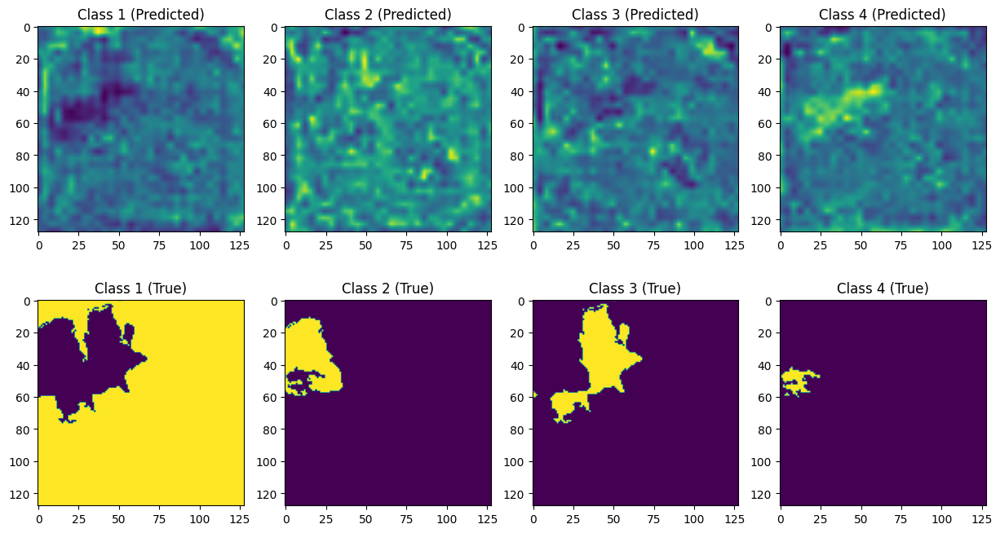

Epoch 1/200:   0%|          | 0/6 [00:14<?, ?it/s, loss=0.977]

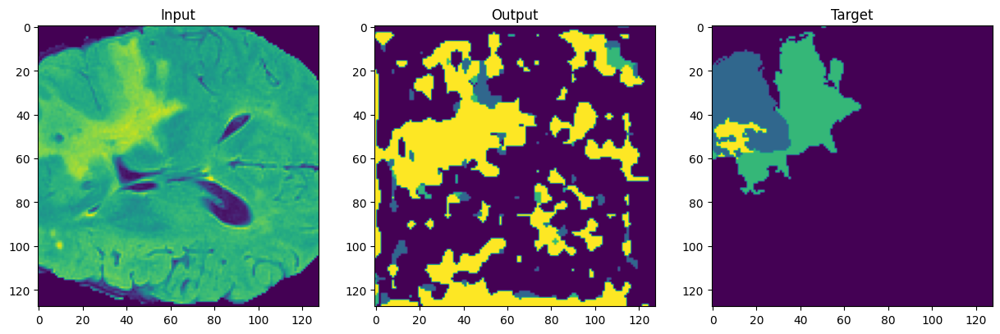

Epoch 1/200:  17%|█▋        | 1/6 [00:15<01:19, 15.85s/it, loss=0.977]

Loss:  0.9769617319107056


Epoch 1/200:  83%|████████▎ | 5/6 [01:07<00:13, 13.01s/it, loss=0.972]

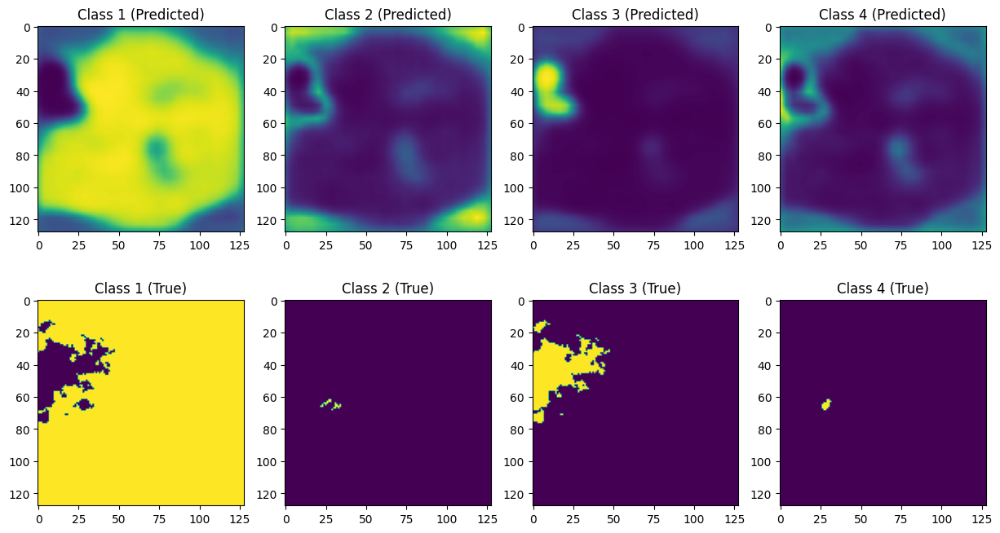

Epoch 1/200: 100%|██████████| 6/6 [01:10<00:00, 11.83s/it, loss=0.912]


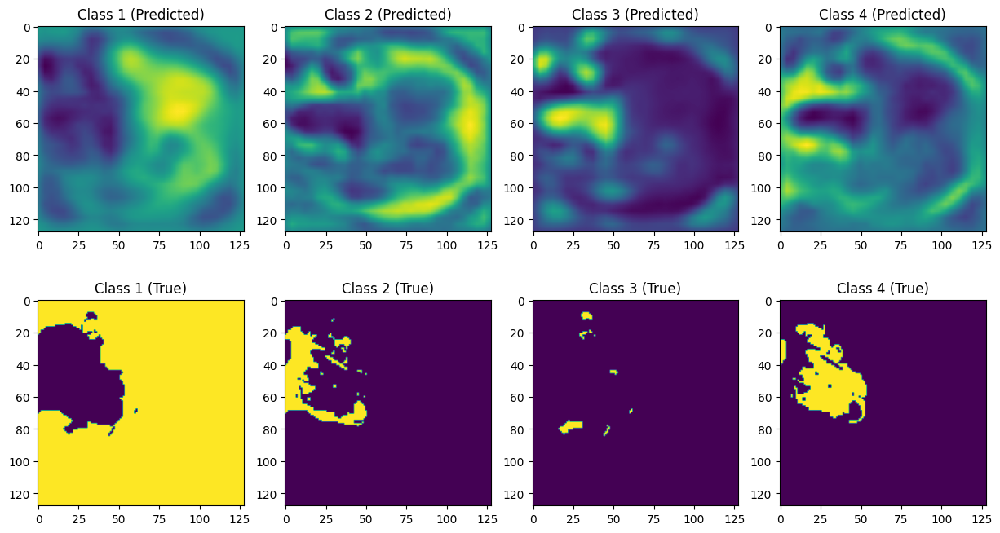

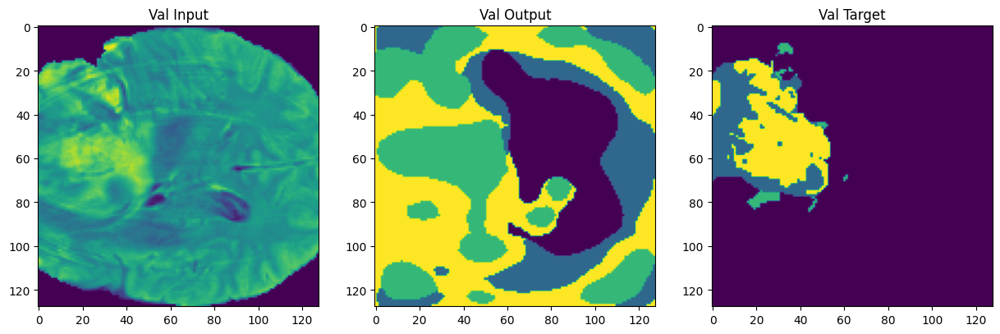

Epoch: 1/200 Average loss: 0.9641506671905518 
Average dice: 0.7030236980917915 
Average IOU: 0.6900435133386831 
Average sensitivity: 0.7324438651037178 
Average specificity: 0.9913595495379914
Validation loss: 0.9070413112640381 
Validation dice: 0.5311010169127048 
Validation IOU: 0.5061783329583495 
Validation sensitivity: 0.7889666673865865 
Validation specificity: 0.9315473495051265


Epoch 2/200:   0%|          | 0/6 [00:00<?, ?it/s]

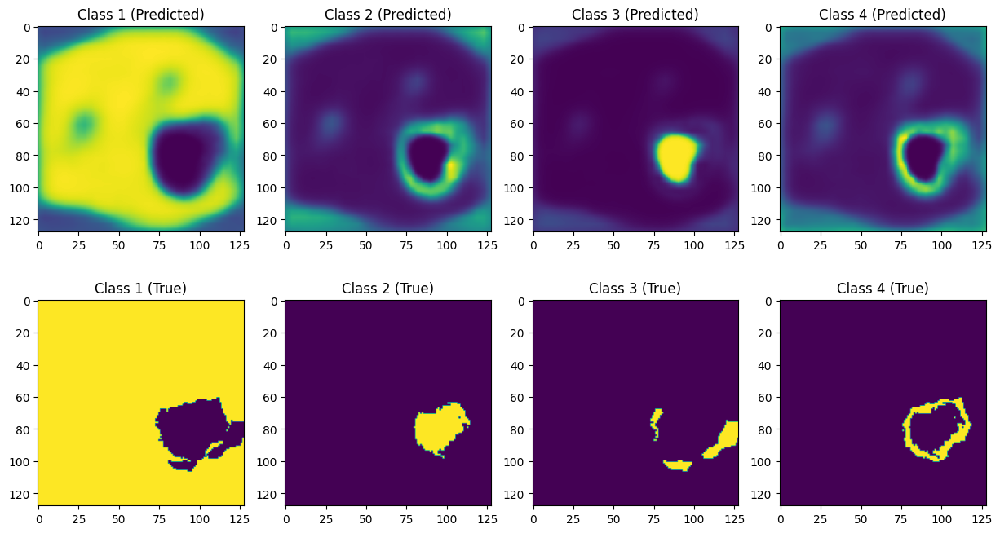

Epoch 2/200:   0%|          | 0/6 [00:14<?, ?it/s, loss=0.972]

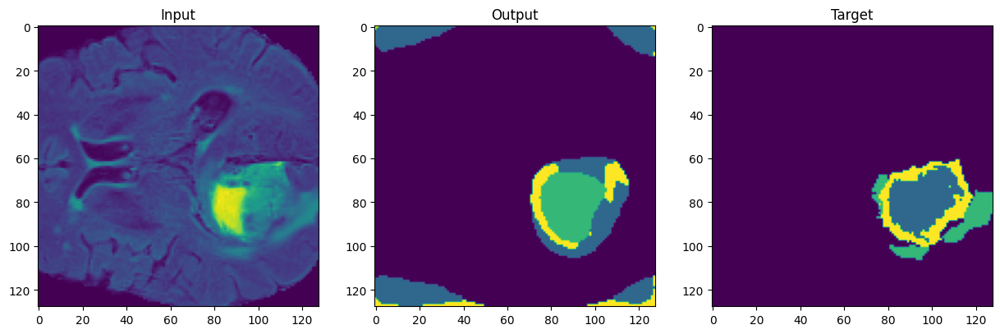

Epoch 2/200:  17%|█▋        | 1/6 [00:15<01:15, 15.13s/it, loss=0.972]

Loss:  0.9721879363059998


Epoch 2/200:  83%|████████▎ | 5/6 [01:09<00:13, 13.54s/it, loss=0.972]

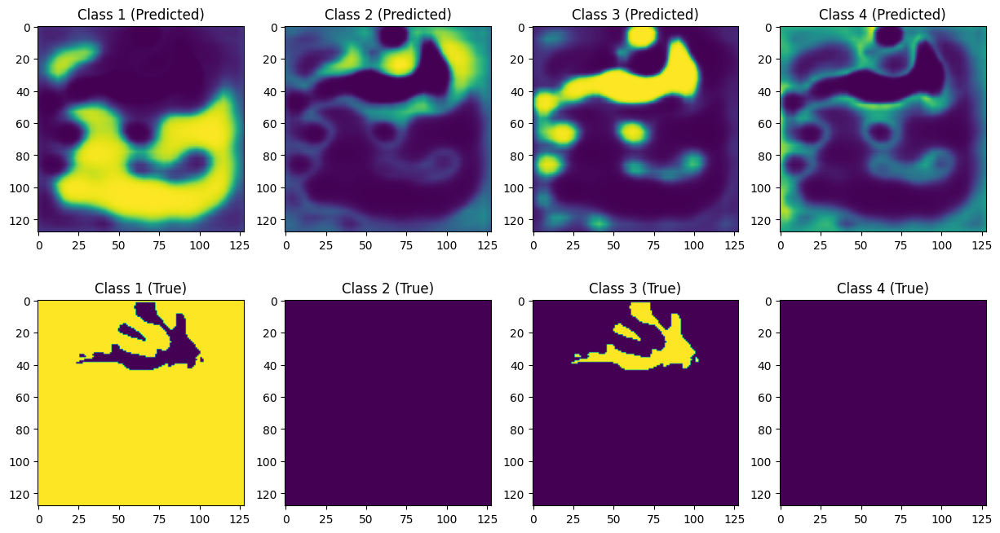

Epoch 2/200: 100%|██████████| 6/6 [01:12<00:00, 12.08s/it, loss=0.901]


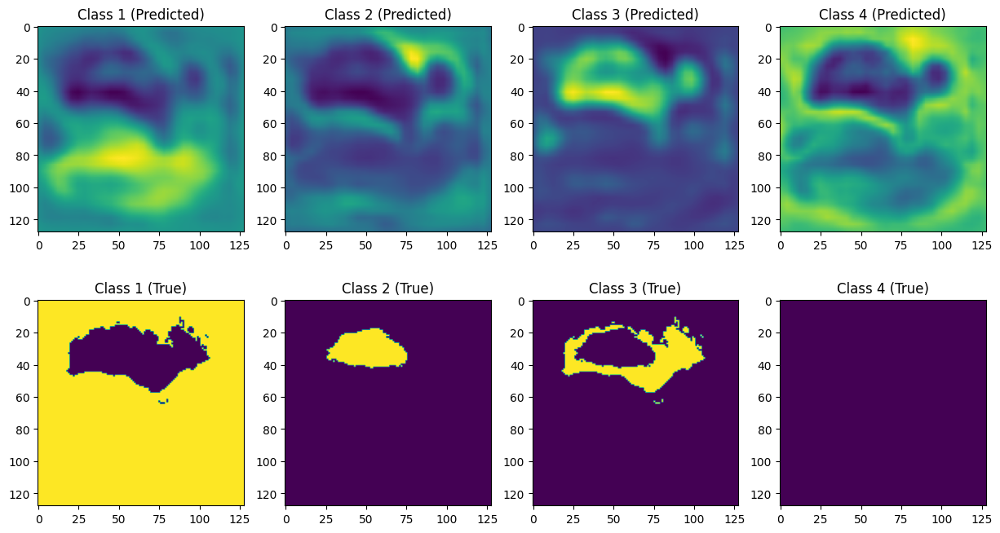

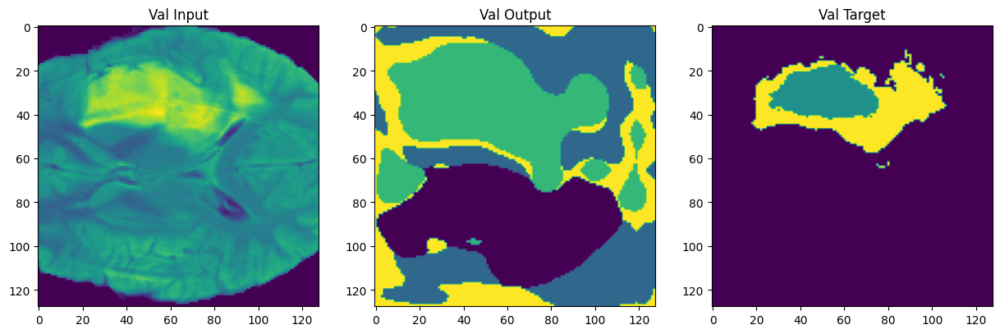

Epoch: 2/200 Average loss: 0.9603678584098816 
Average dice: 0.6668613788401743 
Average IOU: 0.6479168139232078 
Average sensitivity: 0.7510275039291224 
Average specificity: 0.9836214336519112
Validation loss: 0.897297739982605 
Validation dice: 0.45588134580491113 
Validation IOU: 0.4297908774666861 
Validation sensitivity: 0.7946401175148354 
Validation specificity: 0.884168441593647


Epoch 3/200:   0%|          | 0/6 [00:00<?, ?it/s]

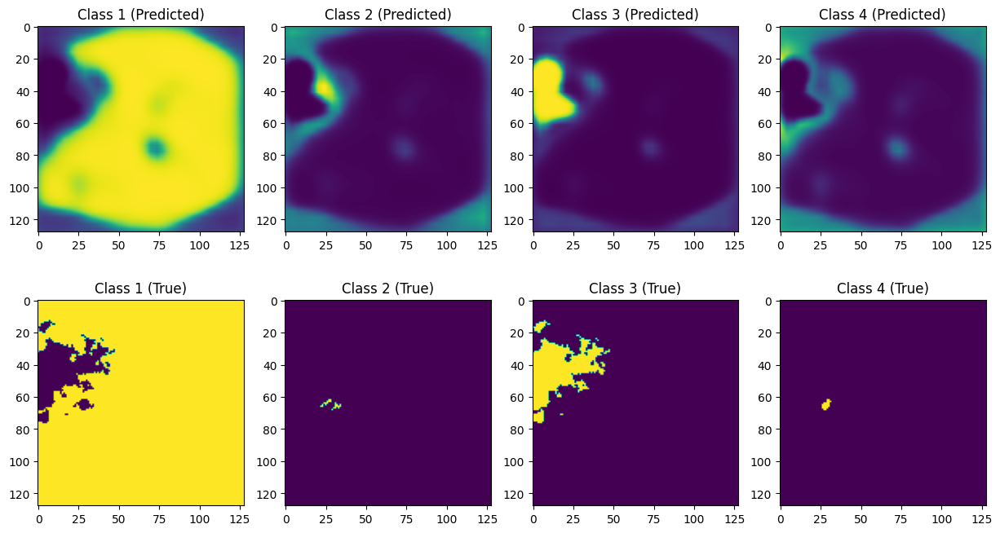

Epoch 3/200:   0%|          | 0/6 [00:14<?, ?it/s, loss=0.972]

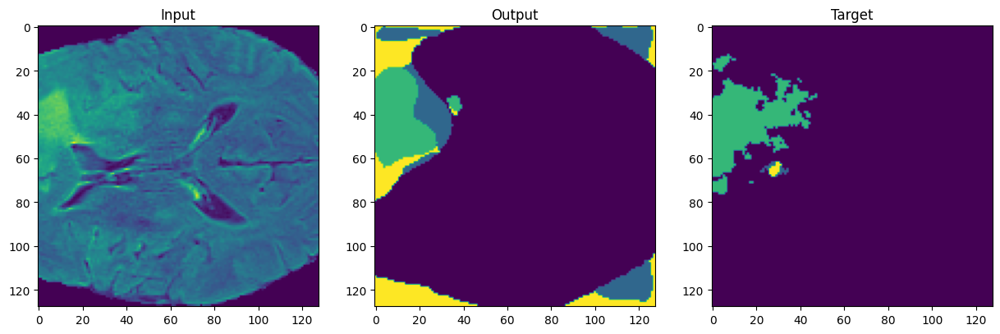

Epoch 3/200:  17%|█▋        | 1/6 [00:15<01:15, 15.12s/it, loss=0.972]

Loss:  0.9717968702316284


Epoch 3/200:  83%|████████▎ | 5/6 [01:07<00:13, 13.42s/it, loss=0.971]

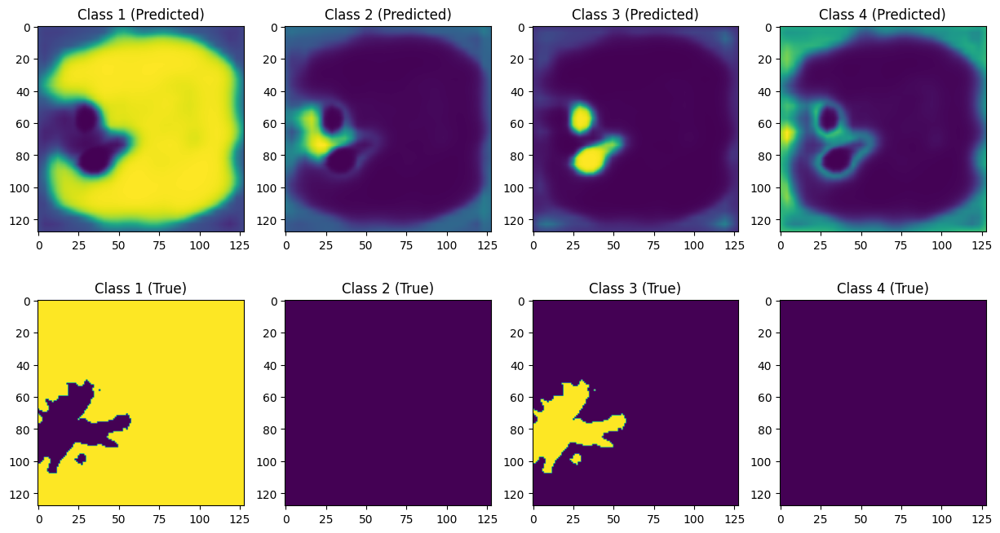

Epoch 3/200: 100%|██████████| 6/6 [01:10<00:00, 11.81s/it, loss=0.908]


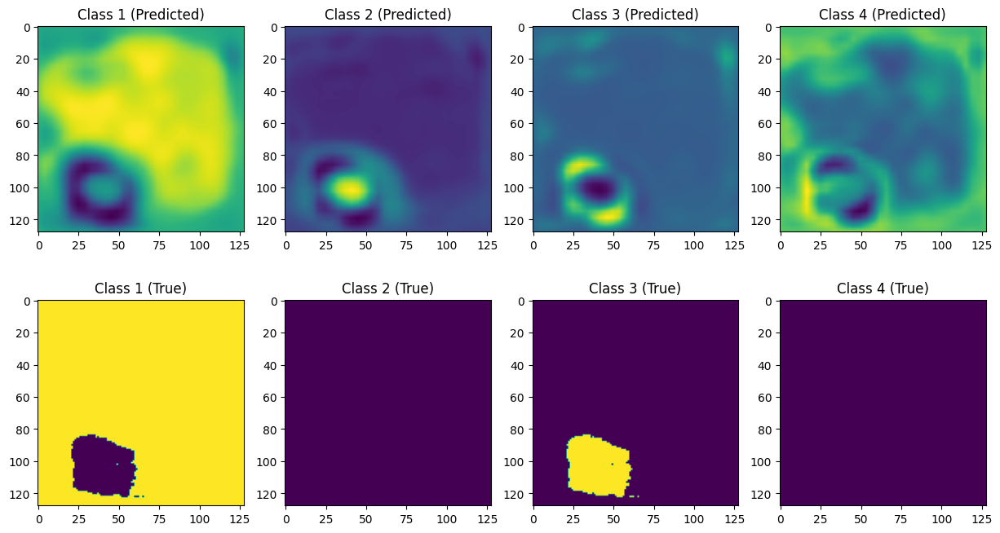

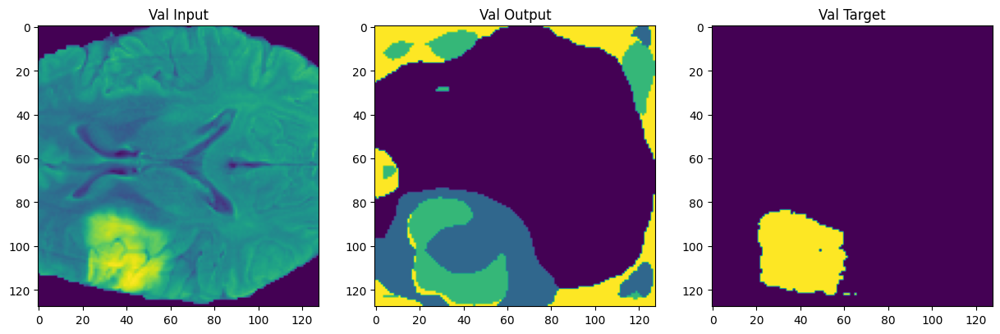

Epoch: 3/200 Average loss: 0.9605740308761597 
Average dice: 0.614213053501771 
Average IOU: 0.5988146142341604 
Average sensitivity: 0.7474281732857805 
Average specificity: 0.9760976505485621
Validation loss: 0.8711881637573242 
Validation dice: 0.6840814267742398 
Validation IOU: 0.6572516265782478 
Validation sensitivity: 0.7830255730588318 
Validation specificity: 0.9668533584102988


Epoch 4/200:   0%|          | 0/6 [00:00<?, ?it/s]

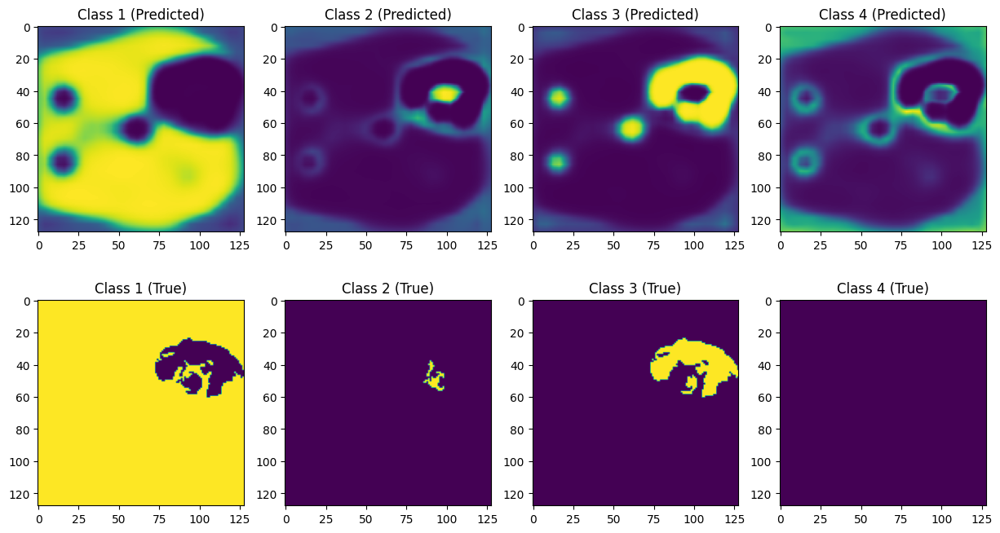

Epoch 4/200:   0%|          | 0/6 [00:15<?, ?it/s, loss=0.971]

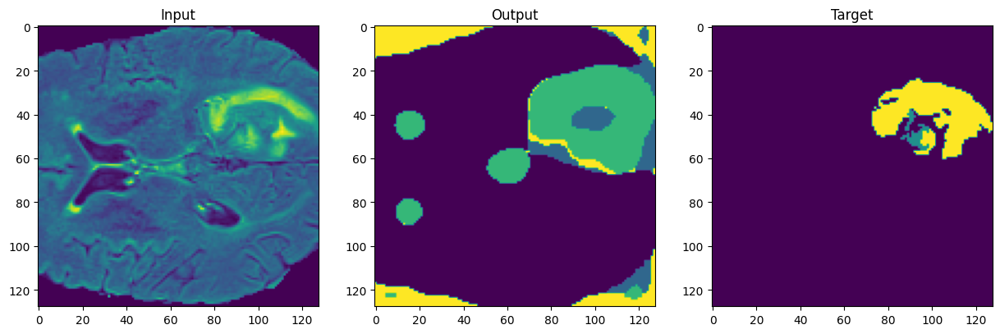

Epoch 4/200:  17%|█▋        | 1/6 [00:16<01:24, 16.90s/it, loss=0.971]

Loss:  0.9712737798690796


Epoch 4/200:  83%|████████▎ | 5/6 [01:09<00:13, 13.43s/it, loss=0.97]

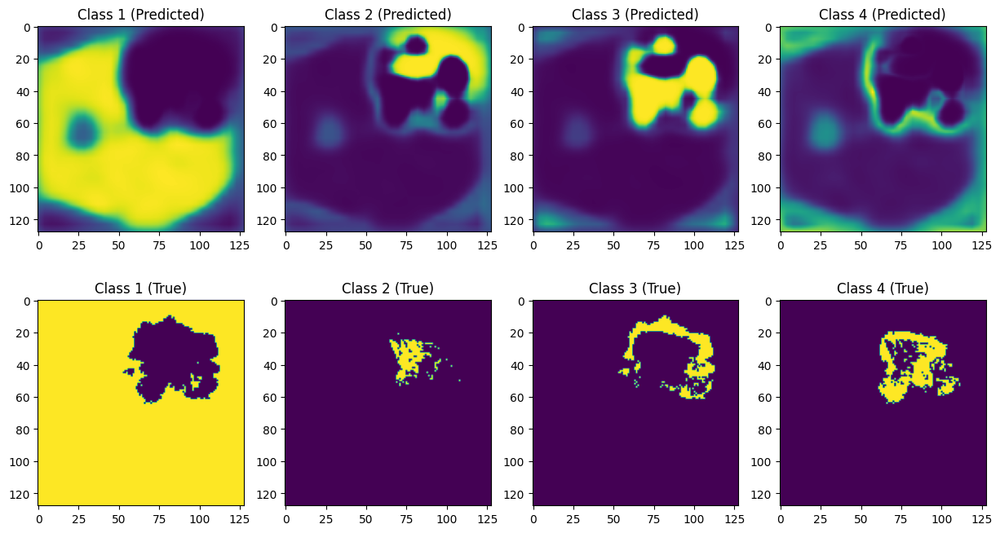

Epoch 4/200: 100%|██████████| 6/6 [01:13<00:00, 12.19s/it, loss=0.91]


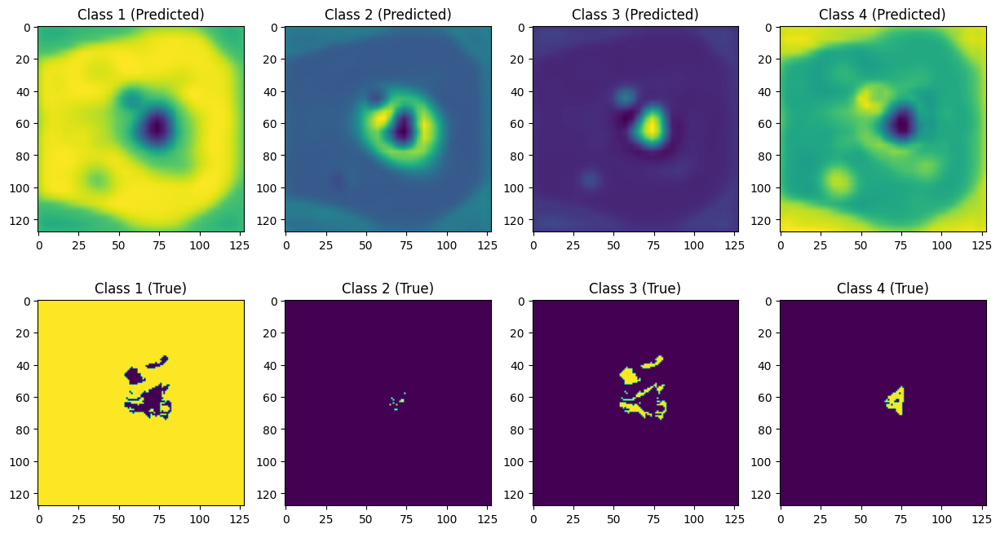

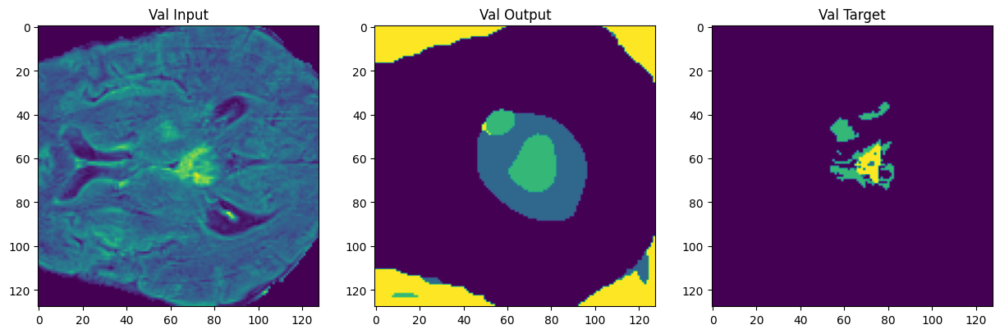

Epoch: 4/200 Average loss: 0.9610234498977661 
Average dice: 0.7117910596274661 
Average IOU: 0.6868677840903326 
Average sensitivity: 0.7667624139781674 
Average specificity: 0.9771523701599839
Validation loss: 0.8842082619667053 
Validation dice: 0.706518564941536 
Validation IOU: 0.6815972208256713 
Validation sensitivity: 0.774303702176624 
Validation specificity: 0.9650799611583352


Epoch 5/200:   0%|          | 0/6 [00:00<?, ?it/s]

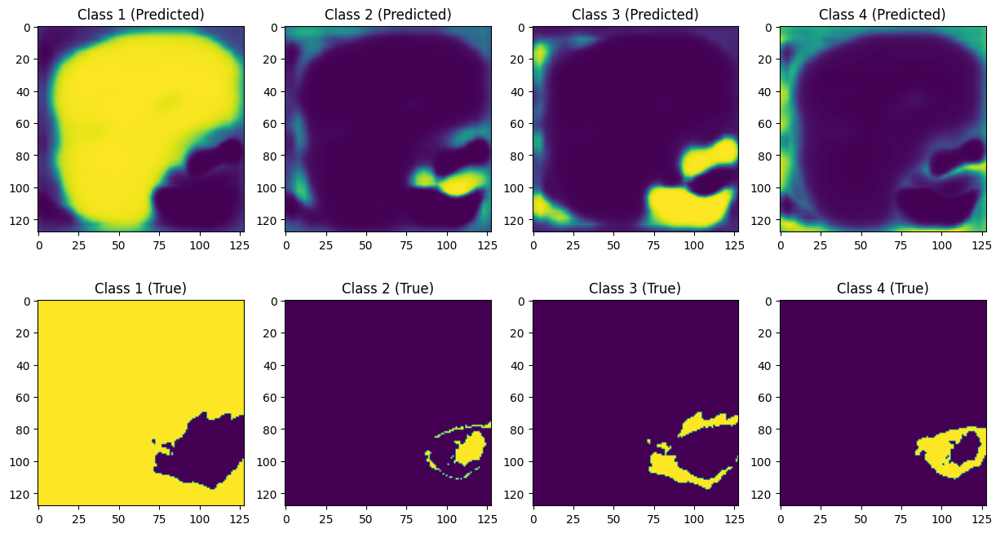

Epoch 5/200:   0%|          | 0/6 [00:14<?, ?it/s, loss=0.97]

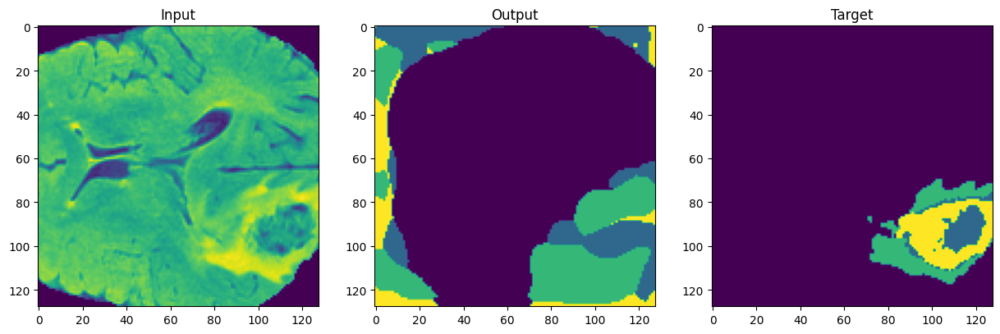

Epoch 5/200:  17%|█▋        | 1/6 [00:15<01:19, 15.85s/it, loss=0.97]

Loss:  0.969861626625061


Epoch 5/200:  83%|████████▎ | 5/6 [01:10<00:13, 13.65s/it, loss=0.971]

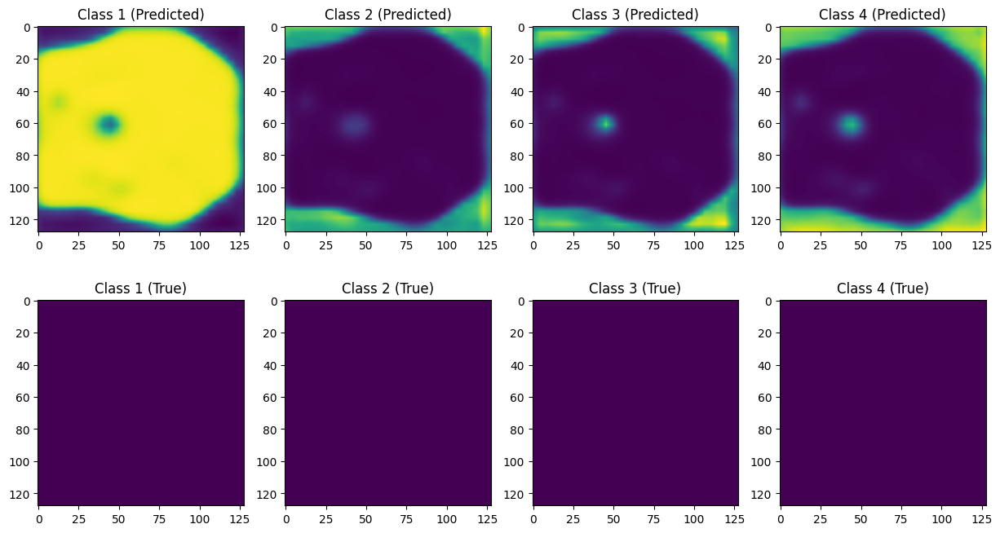

Epoch 5/200: 100%|██████████| 6/6 [01:13<00:00, 12.28s/it, loss=0.898]


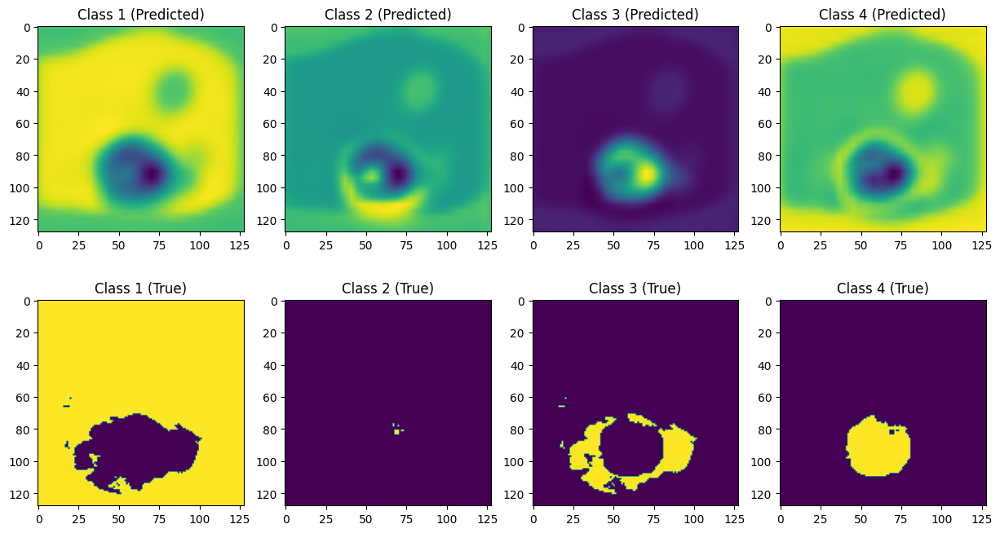

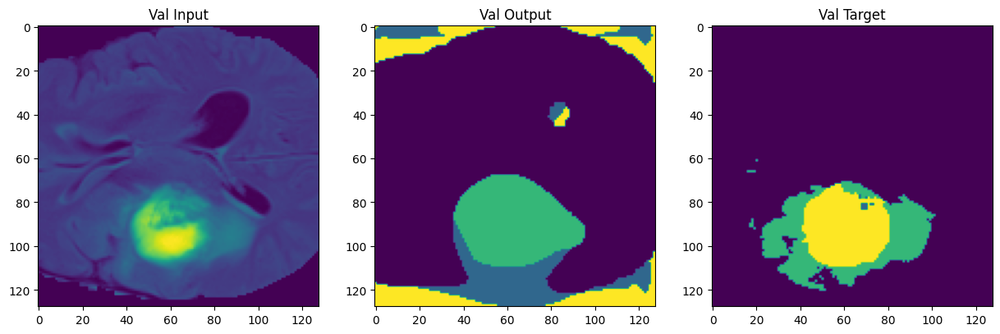

Epoch: 5/200 Average loss: 0.9581478834152222 
Average dice: 0.6766010402092606 
Average IOU: 0.6552198436012269 
Average sensitivity: 0.7598500726205093 
Average specificity: 0.9758714884180874
Validation loss: 0.8944613933563232 
Validation dice: 0.6585260011939372 
Validation IOU: 0.6317077654166188 
Validation sensitivity: 0.7935210313780583 
Validation specificity: 0.9584844340570271


Epoch 6/200:   0%|          | 0/6 [00:00<?, ?it/s]

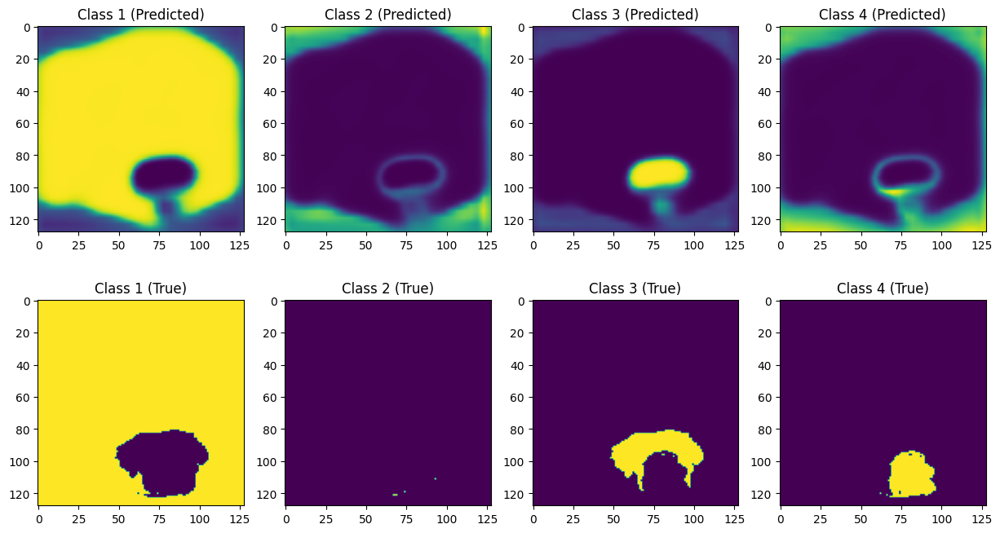

Epoch 6/200:   0%|          | 0/6 [00:14<?, ?it/s, loss=0.972]

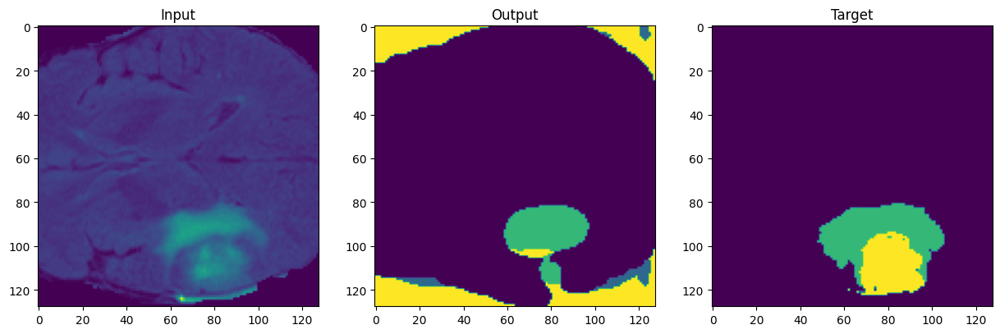

Epoch 6/200:  17%|█▋        | 1/6 [00:15<01:16, 15.20s/it, loss=0.972]

Loss:  0.9717471599578857


Epoch 6/200:  83%|████████▎ | 5/6 [01:07<00:13, 13.31s/it, loss=0.97]

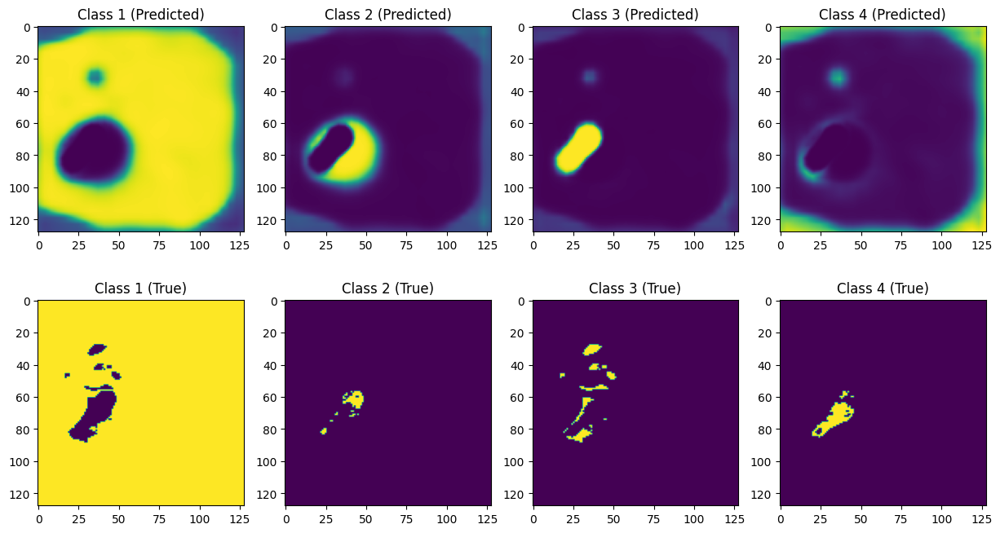

Epoch 6/200: 100%|██████████| 6/6 [01:11<00:00, 11.86s/it, loss=0.902]


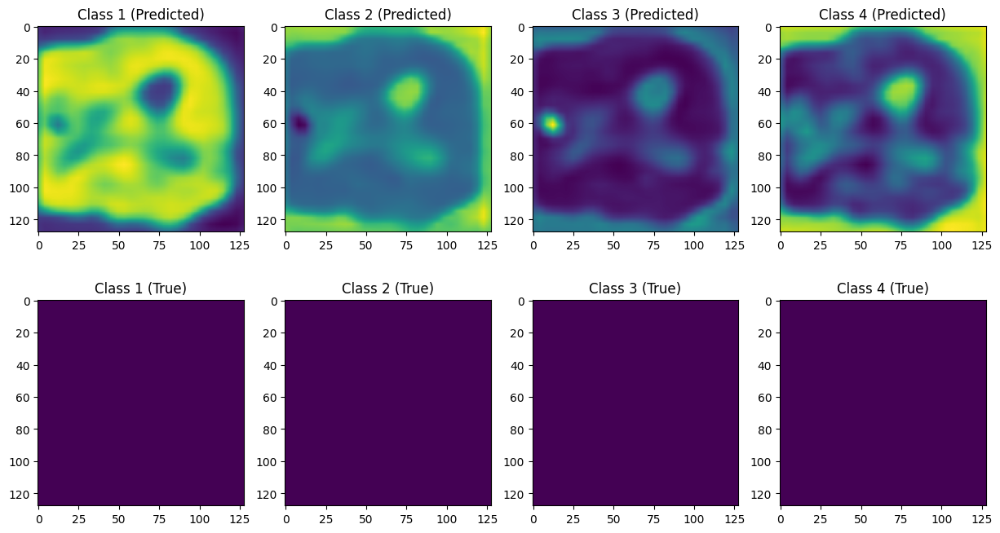

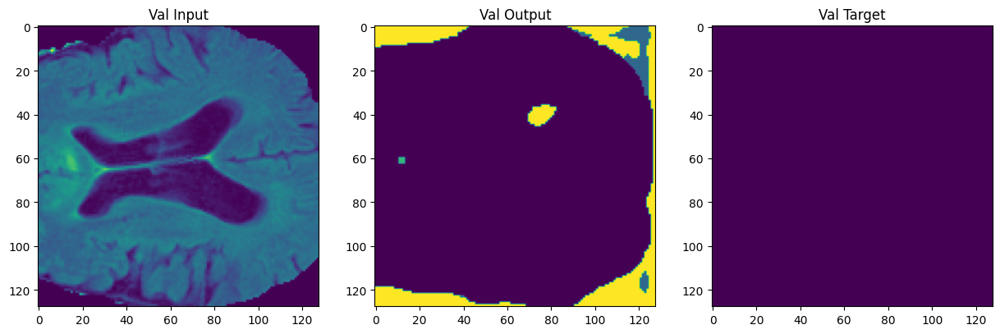

Epoch: 6/200 Average loss: 0.958612859249115 
Average dice: 0.6724957549334991 
Average IOU: 0.6482437028320115 
Average sensitivity: 0.7703824332164116 
Average specificity: 0.9738828261527899
Validation loss: 0.880673348903656 
Validation dice: 0.7200728634019311 
Validation IOU: 0.6867170909532274 
Validation sensitivity: 0.800326251545177 
Validation specificity: 0.9745672343298792


Epoch 7/200:   0%|          | 0/6 [00:00<?, ?it/s]

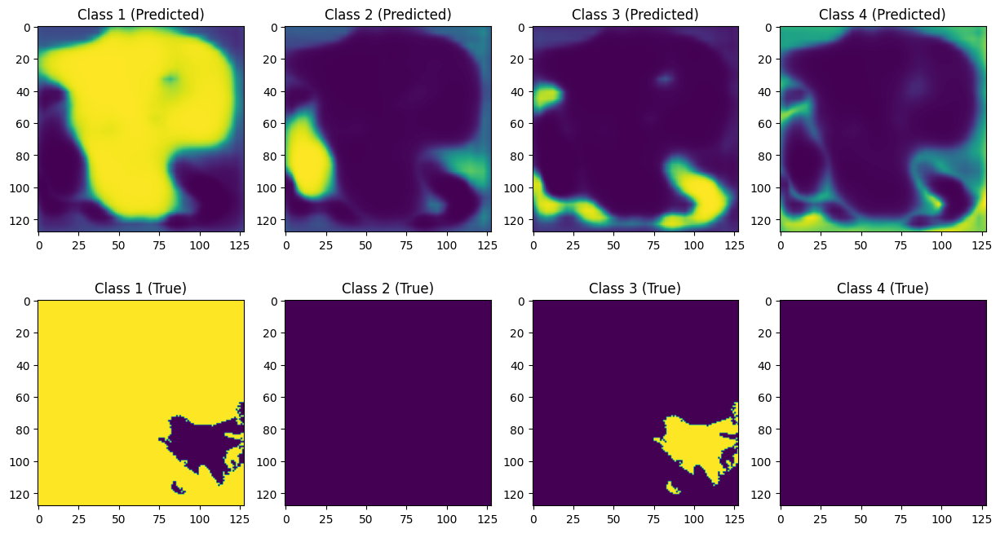

Epoch 7/200:   0%|          | 0/6 [00:15<?, ?it/s, loss=0.969]

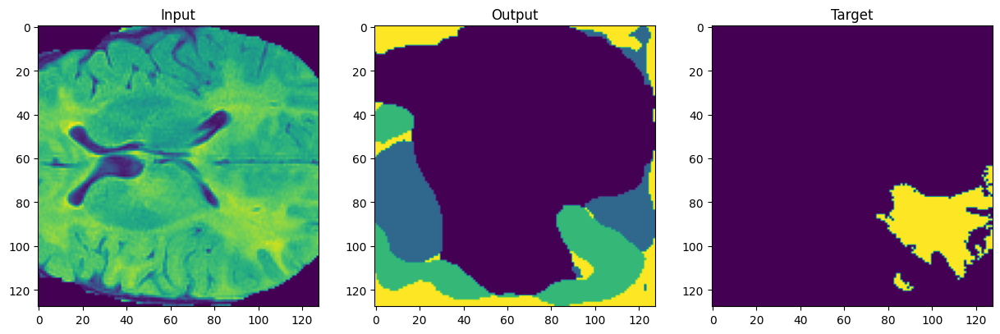

Epoch 7/200:  17%|█▋        | 1/6 [00:16<01:21, 16.22s/it, loss=0.969]

Loss:  0.9689792990684509


Epoch 7/200:  83%|████████▎ | 5/6 [01:10<00:13, 13.69s/it, loss=0.97]

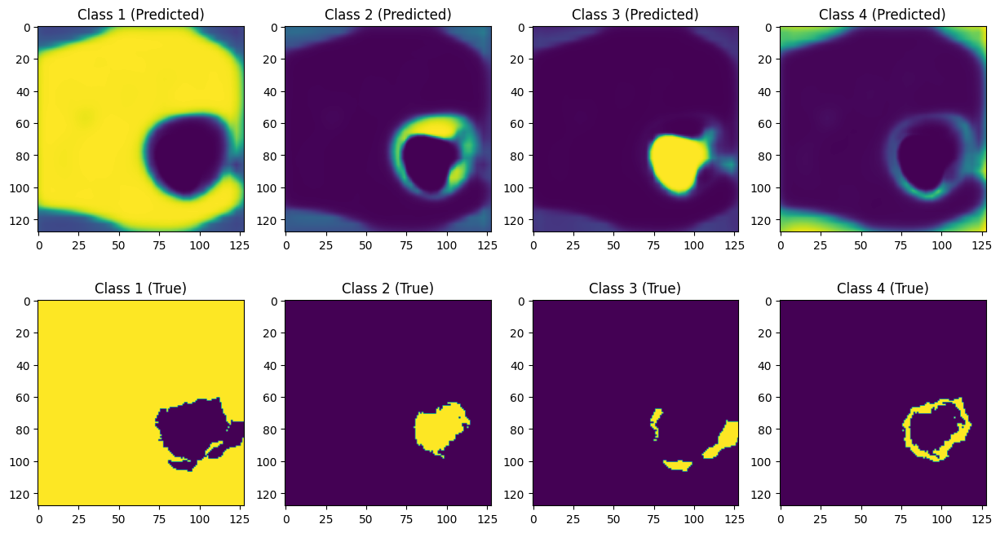

Epoch 7/200: 100%|██████████| 6/6 [01:14<00:00, 12.37s/it, loss=0.904]


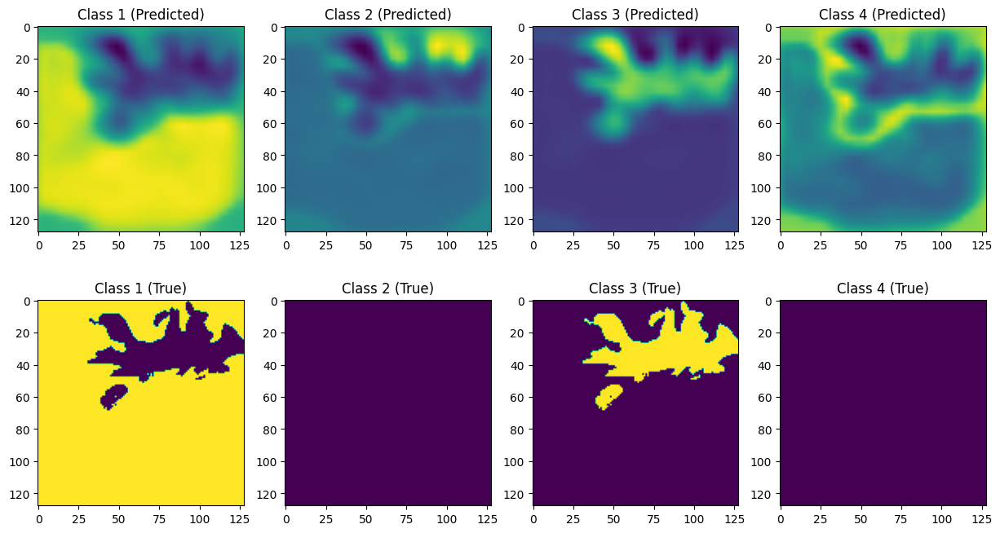

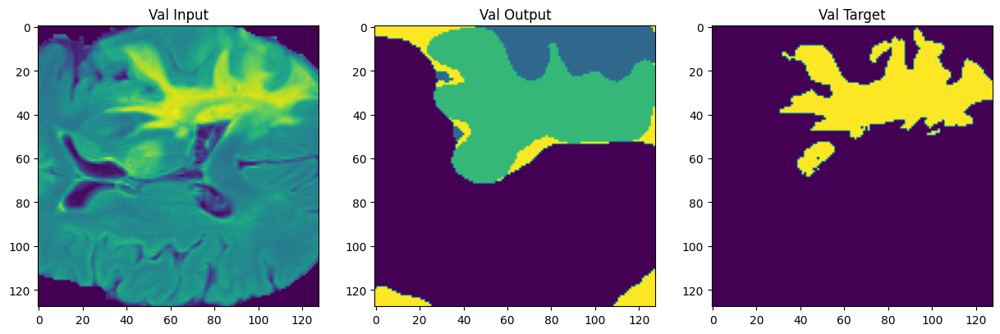

Epoch: 7/200 Average loss: 0.958518922328949 
Average dice: 0.7327543882889993 
Average IOU: 0.7004618245249663 
Average sensitivity: 0.7888871051221661 
Average specificity: 0.9764564380638776
Validation loss: 0.882929265499115 
Validation dice: 0.7376872325283663 
Validation IOU: 0.7007513256478312 
Validation sensitivity: 0.816422398880934 
Validation specificity: 0.9705174019560218


Epoch 8/200:   0%|          | 0/6 [00:00<?, ?it/s]

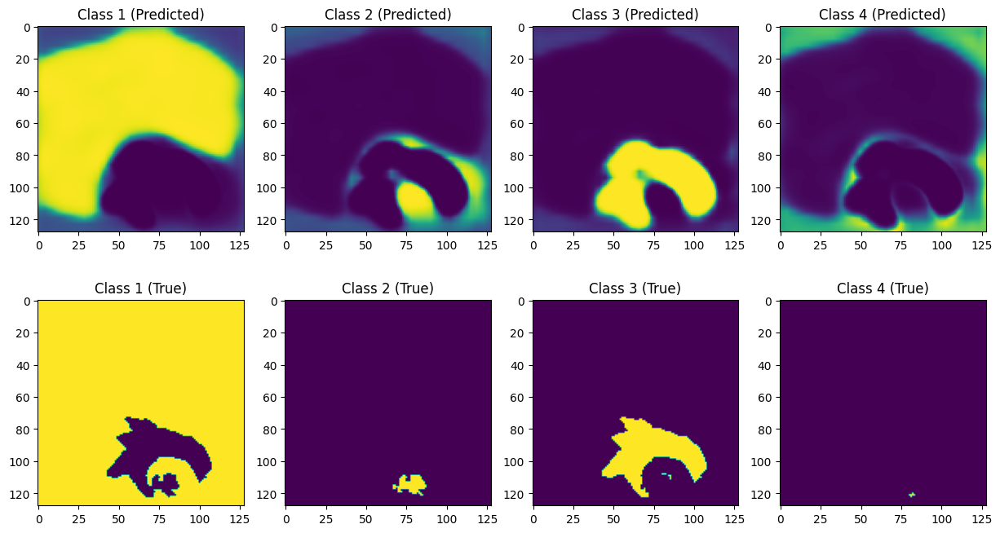

Epoch 8/200:   0%|          | 0/6 [00:14<?, ?it/s, loss=0.969]

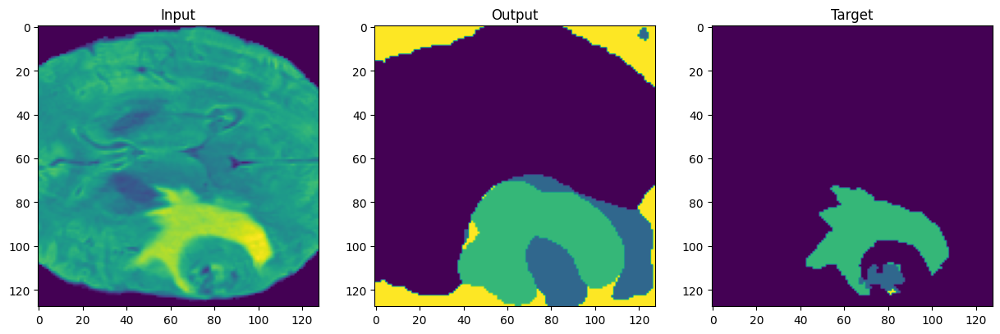

Epoch 8/200:  17%|█▋        | 1/6 [00:16<01:20, 16.10s/it, loss=0.969]

Loss:  0.9693005084991455


Epoch 8/200:  83%|████████▎ | 5/6 [01:10<00:13, 13.67s/it, loss=0.97]

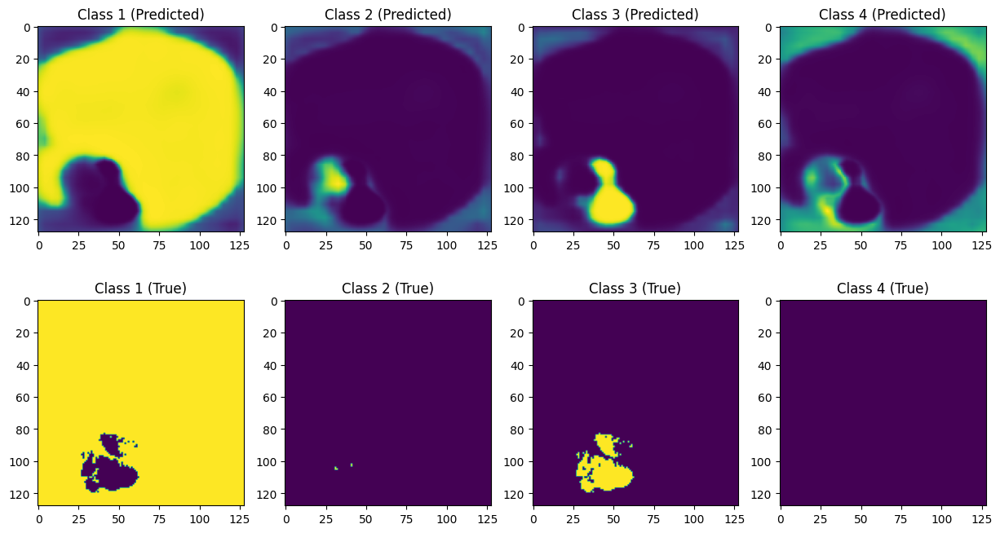

Epoch 8/200: 100%|██████████| 6/6 [01:13<00:00, 12.22s/it, loss=0.884]


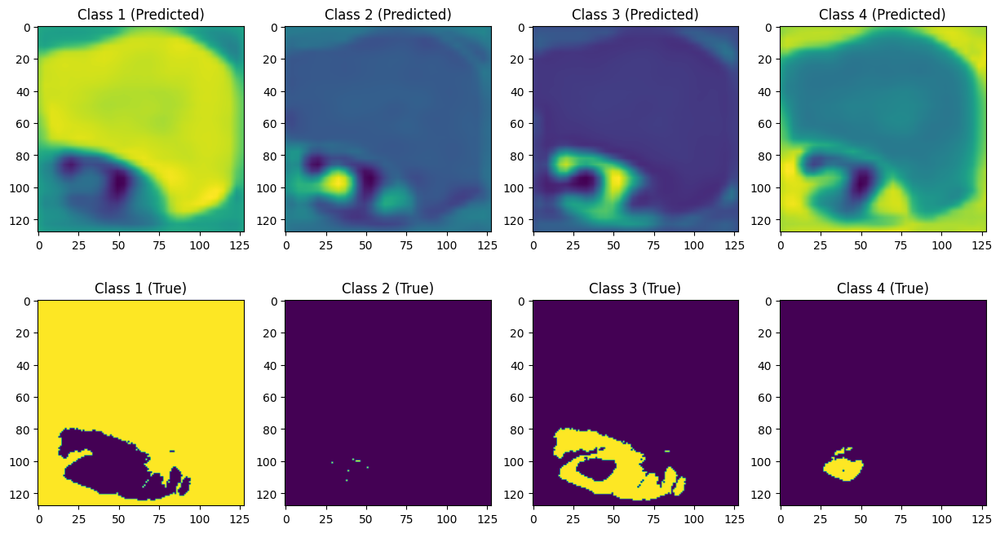

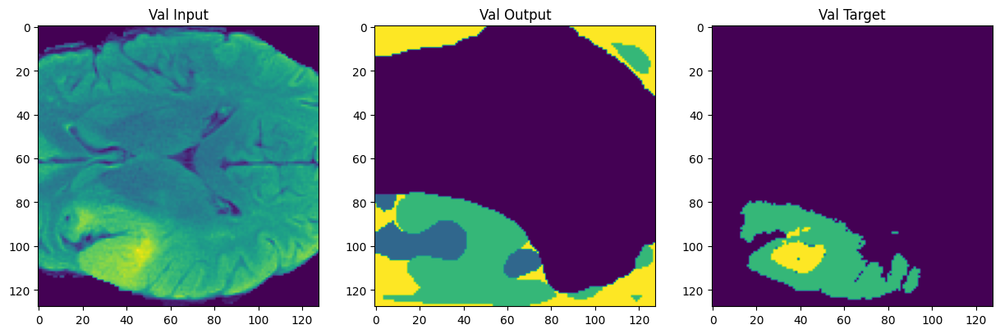

Epoch: 8/200 Average loss: 0.9550661444664001 
Average dice: 0.7177861686165897 
Average IOU: 0.6842303053482077 
Average sensitivity: 0.7903900840154849 
Average specificity: 0.9787043454720973
Validation loss: 0.8771117925643921 
Validation dice: 0.6752992023160234 
Validation IOU: 0.6390006238623074 
Validation sensitivity: 0.8138098078812337 
Validation specificity: 0.9558055937290192


Epoch 9/200:   0%|          | 0/6 [00:00<?, ?it/s]

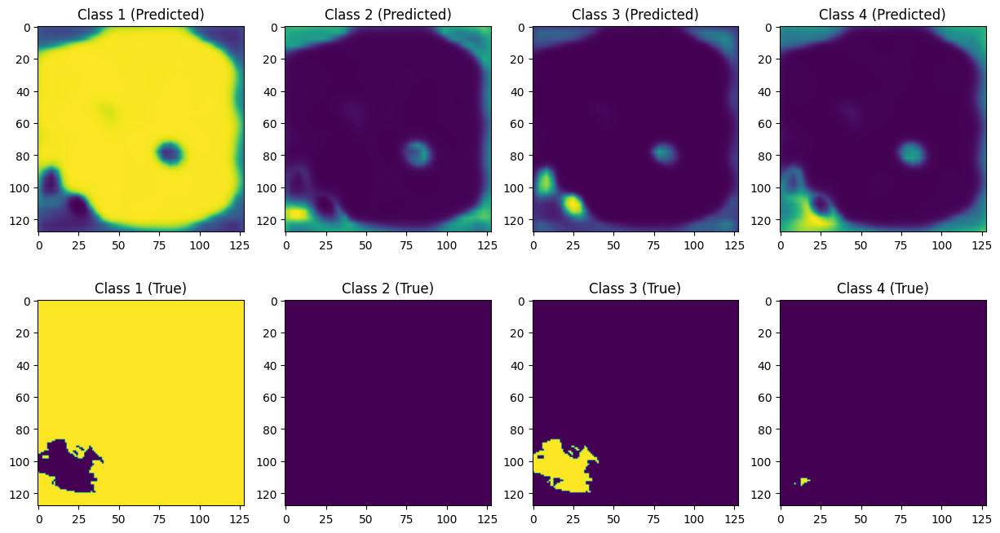

Epoch 9/200:   0%|          | 0/6 [00:14<?, ?it/s, loss=0.969]

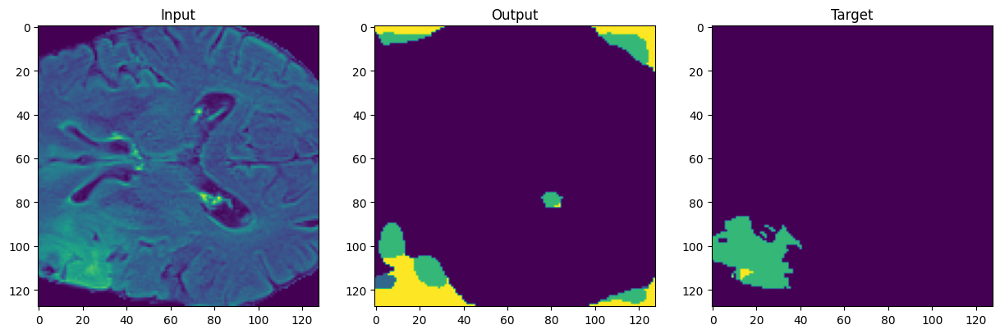

Epoch 9/200:  17%|█▋        | 1/6 [00:15<01:17, 15.44s/it, loss=0.969]

Loss:  0.9689734578132629


Epoch 9/200:  83%|████████▎ | 5/6 [01:09<00:13, 13.73s/it, loss=0.971]

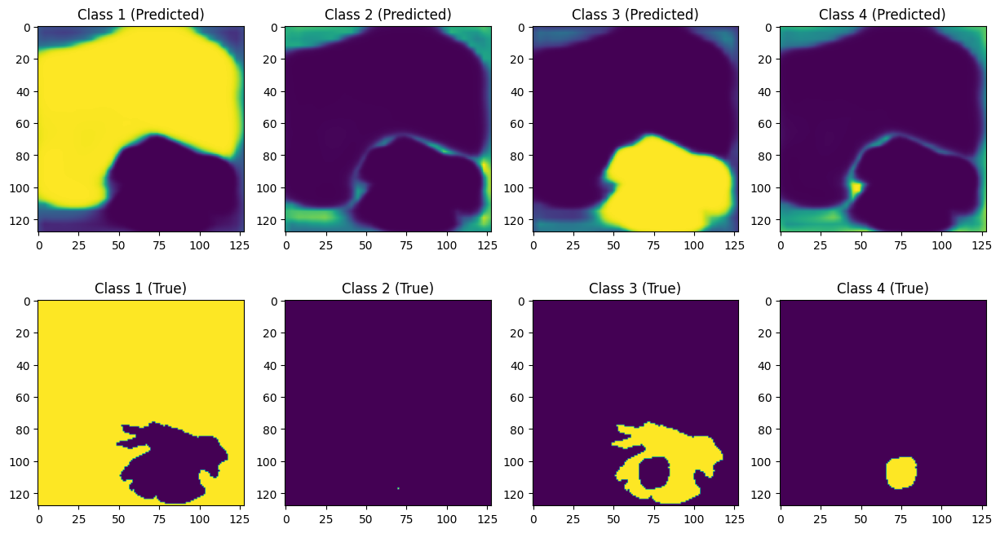

Epoch 9/200: 100%|██████████| 6/6 [01:13<00:00, 12.18s/it, loss=0.896]


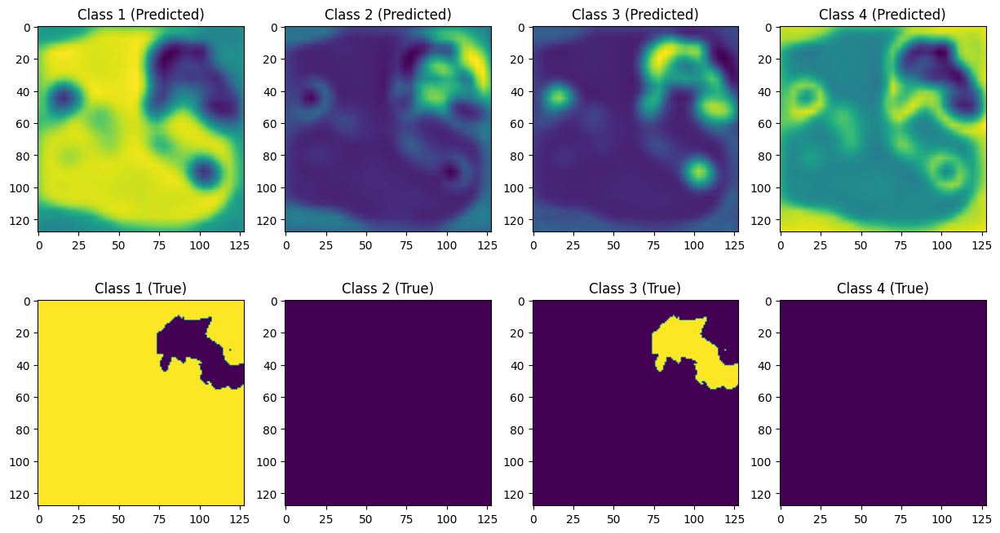

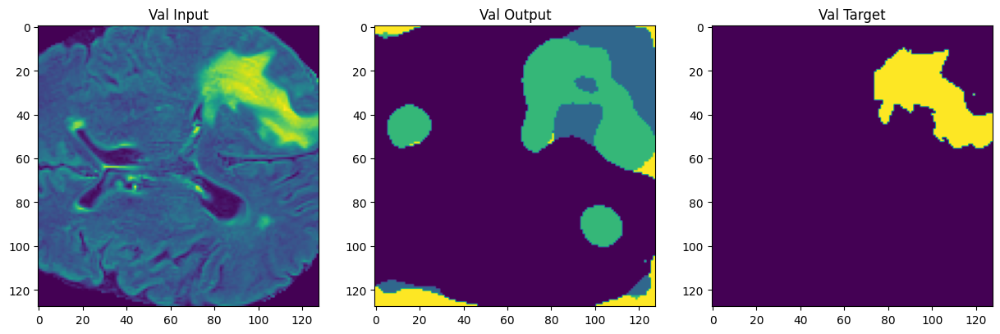

Epoch: 9/200 Average loss: 0.9569659233093262 
Average dice: 0.6874004832821741 
Average IOU: 0.6535072331773613 
Average sensitivity: 0.7964435914117406 
Average specificity: 0.9765662732803033
Validation loss: 0.8964686393737793 
Validation dice: 0.7179453119055641 
Validation IOU: 0.6802944274388527 
Validation sensitivity: 0.8259144612389182 
Validation specificity: 0.963949376065284


Epoch 10/200:   0%|          | 0/6 [00:00<?, ?it/s]

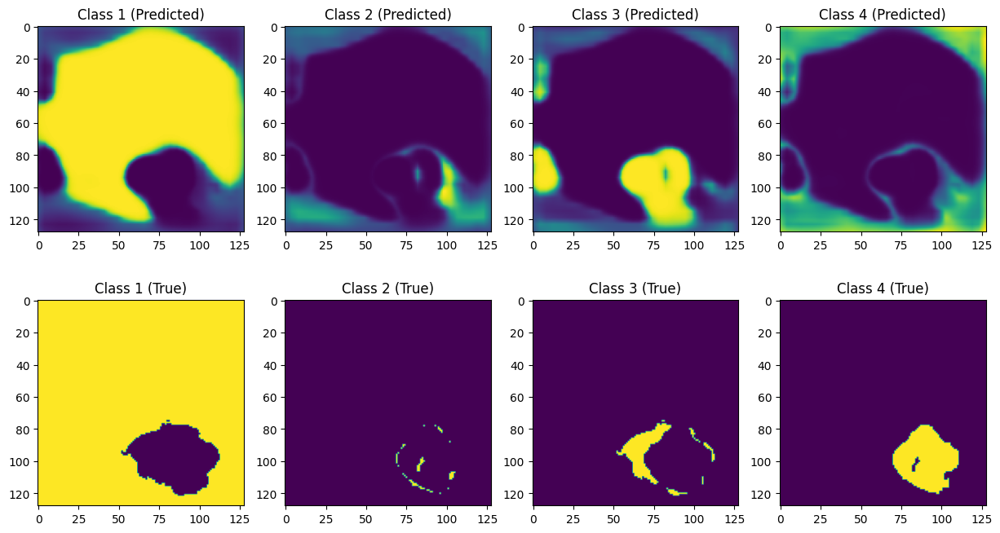

Epoch 10/200:   0%|          | 0/6 [00:14<?, ?it/s, loss=0.969]

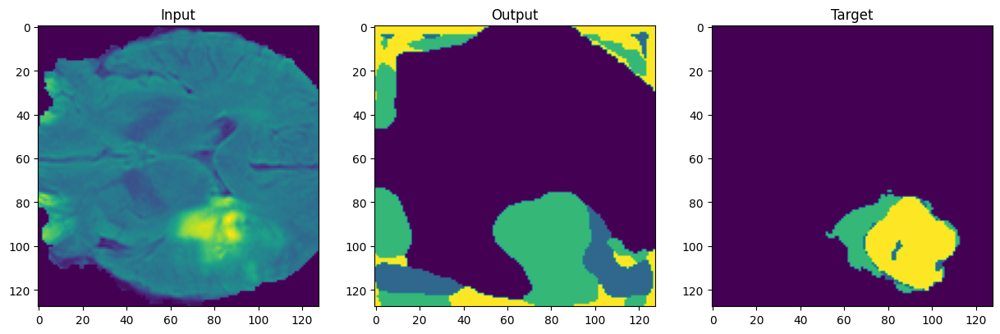

Epoch 10/200:  17%|█▋        | 1/6 [00:15<01:18, 15.76s/it, loss=0.969]

Loss:  0.9688523411750793


Epoch 10/200:  83%|████████▎ | 5/6 [01:10<00:13, 13.78s/it, loss=0.969]

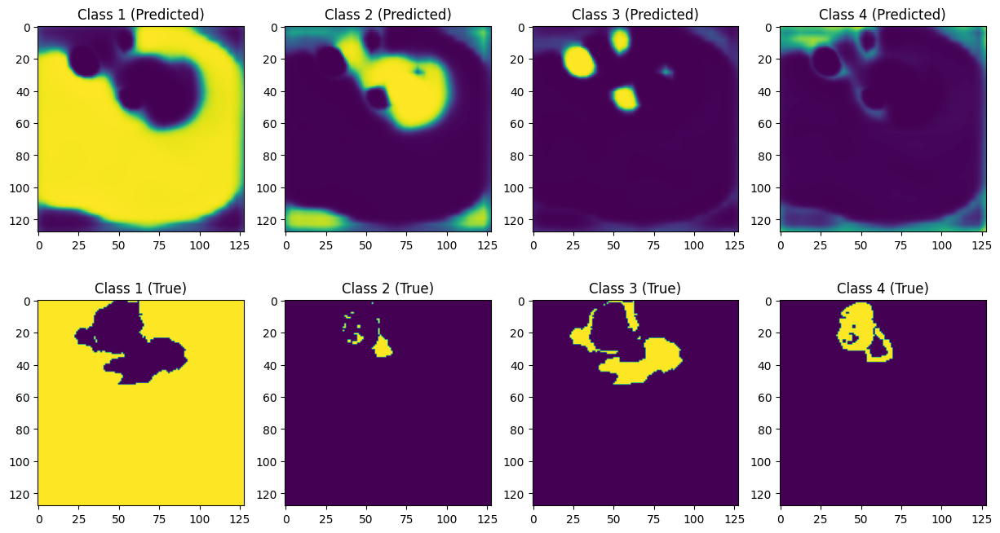

Epoch 10/200: 100%|██████████| 6/6 [01:14<00:00, 12.40s/it, loss=0.917]


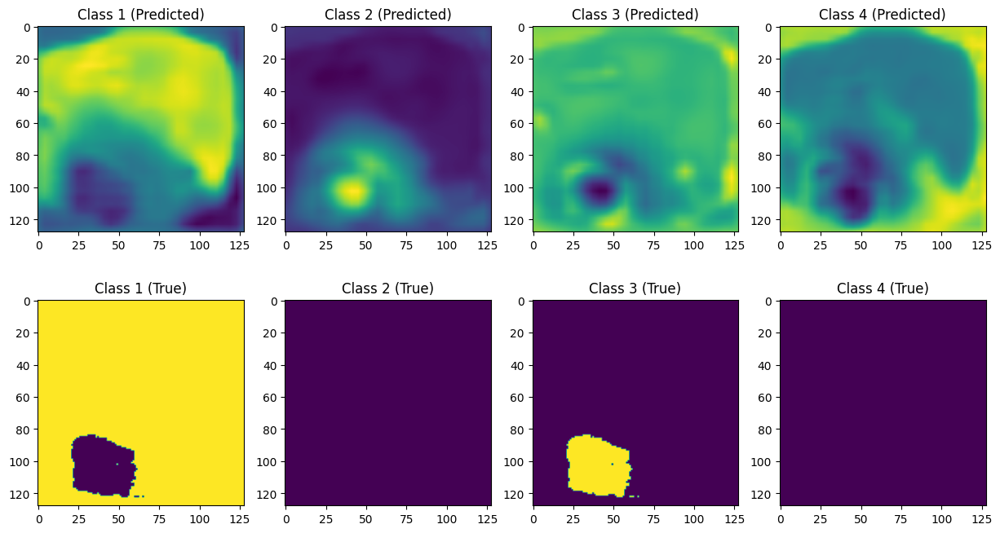

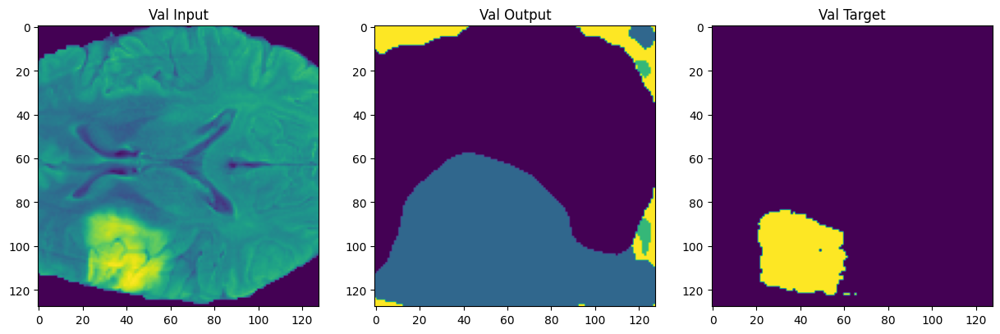

Epoch: 10/200 Average loss: 0.9601010680198669 
Average dice: 0.6606163959578014 
Average IOU: 0.6242858776630951 
Average sensitivity: 0.8011032587393706 
Average specificity: 0.9608374442197767
Validation loss: 0.8608975410461426 
Validation dice: 0.5126998759406709 
Validation IOU: 0.47597096776087733 
Validation sensitivity: 0.8193764735514948 
Validation specificity: 0.87573549011726


Epoch 11/200:   0%|          | 0/6 [00:00<?, ?it/s]

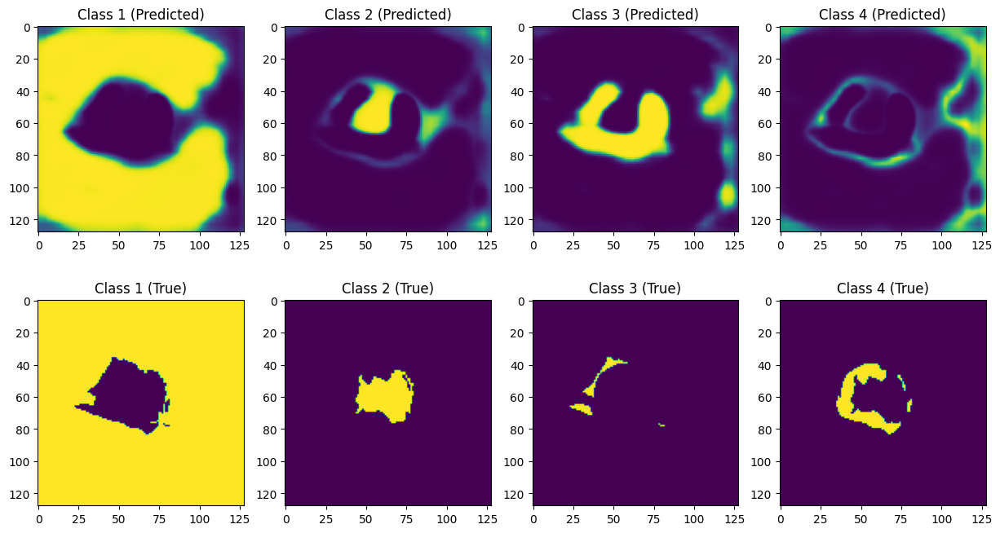

Epoch 11/200:   0%|          | 0/6 [00:16<?, ?it/s, loss=0.967]

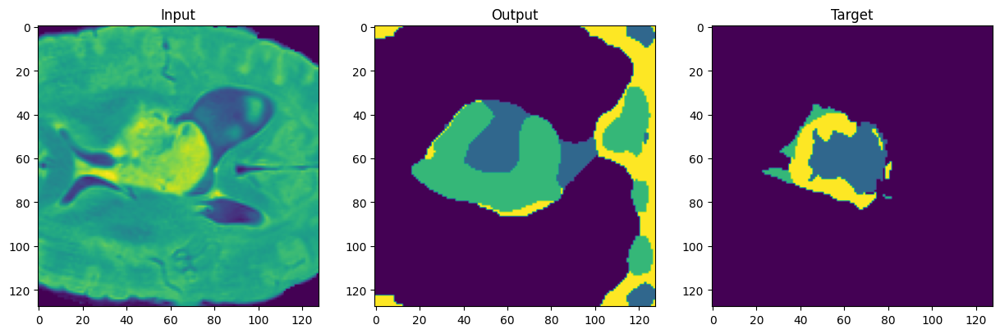

Epoch 11/200:  17%|█▋        | 1/6 [00:17<01:25, 17.14s/it, loss=0.967]

Loss:  0.9668579697608948


Epoch 11/200:  83%|████████▎ | 5/6 [01:12<00:14, 14.06s/it, loss=0.97]

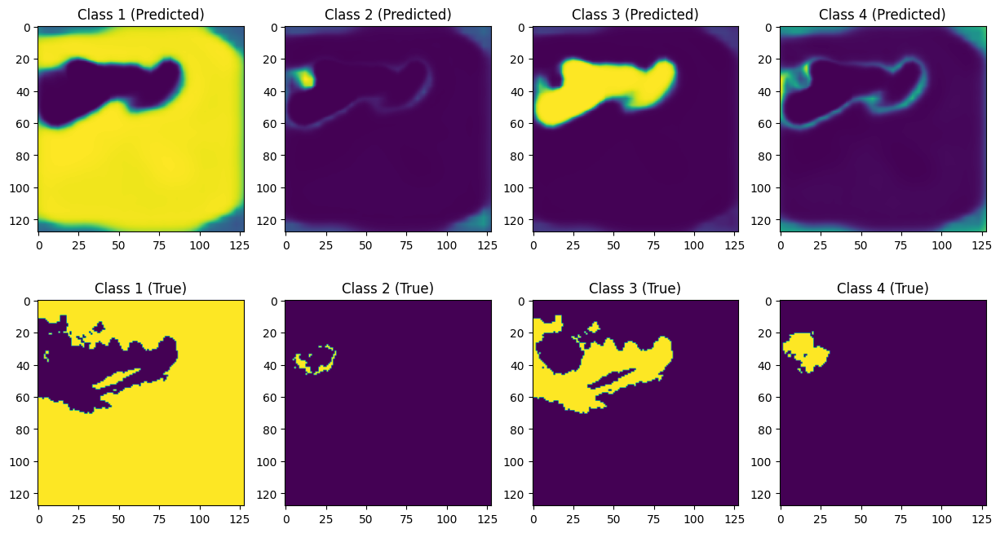

Epoch 11/200: 100%|██████████| 6/6 [01:16<00:00, 12.67s/it, loss=0.886]


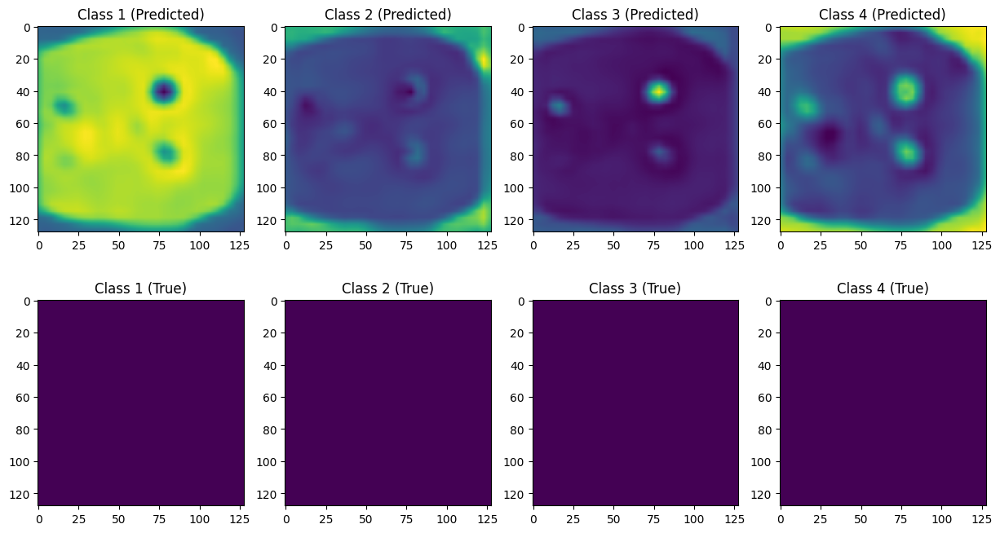

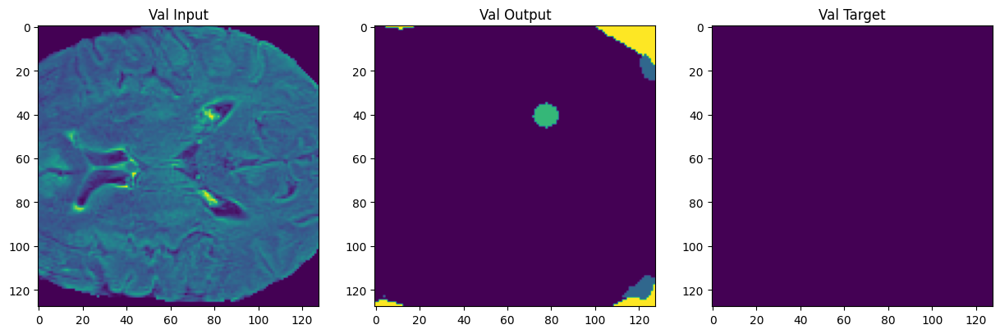

Epoch: 11/200 Average loss: 0.9553033113479614 
Average dice: 0.6400469799200784 
Average IOU: 0.602329490775141 
Average sensitivity: 0.8128456700395219 
Average specificity: 0.9553044459099782
Validation loss: 0.8594508767127991 
Validation dice: 0.7573294259717399 
Validation IOU: 0.7205918025684255 
Validation sensitivity: 0.8296160107980688 
Validation specificity: 0.9680642050225288


Epoch 12/200:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
train()

In [ ]:
loss_values = scores['loss']
plt.plot(range(len(loss_values)), [l.item() for l in loss_values])
plt.show()

# XAI